In [89]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns ; sns.set_context('notebook')
import pystan 
#import stan_utility
import arviz as az
import os
#import mne
import warnings 
import xarray as xr
from scipy.special import expit
from random import sample

warnings.simplefilter('ignore')#removes deprecation warnings
plt.style.use('seaborn-ticks')
%load_ext rpy2.ipython
df =  pd.read_csv('data_modelling_ready.csv')
order = ["accuracy","speed"]
LMEdata = pd.read_csv('MixedModels/LMEdata.csv')
GLMEdata = pd.read_csv('MixedModels/GLMEdata.csv')
colors_wrt = ['purple','darkgrey','indianred','dimgrey']


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


## Note on data trimming


See notebook 0


# N200

## Plotting the ERPs

Following code is ran using mne

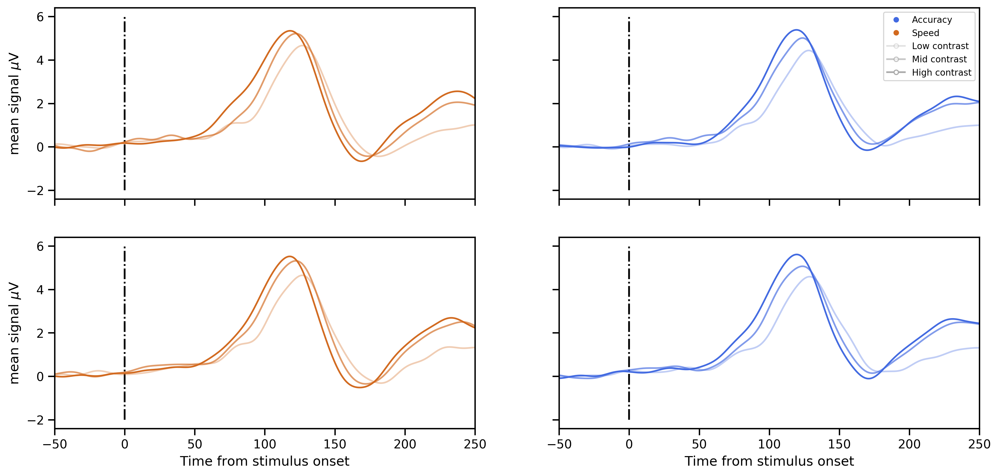

In [5]:
import mne
import warnings 
warnings.simplefilter('ignore')#removes deprecation warnings
plt.style.use('seaborn-poster')
#%load_ext rpy2.ipython
data = df_full =  pd.read_csv('data_modelling_ready.csv')
order = ["accuracy","speed"]
LMEdata = pd.read_csv('MixedModels/LMEdata.csv')
colors_wrt = ['purple','k','indianred','royalblue']


evoked_dir = '/media/gabriel/DATA/ForceEEG/processing_EEG/N200_estimates/N200_epochs/'
evoked_list = []

for f in os.listdir(evoked_dir):
    evoked_list.append(mne.read_evokeds(evoked_dir+f, verbose=True))
    
low_speed_1,low_speed_2,low_speed_3,low_accuracy_1,low_accuracy_2,low_accuracy_3  = [],[],[],[],[],[]
high_speed_1,high_speed_2,high_speed_3,high_accuracy_1,high_accuracy_2,high_accuracy_3  = [],[],[],[],[],[]
for i in np.arange(len(evoked_list)):
    low_speed_1.append(evoked_list[i][0])
    low_speed_2.append(evoked_list[i][1])
    low_speed_3.append(evoked_list[i][2])
    low_accuracy_1.append(evoked_list[i][3])
    low_accuracy_2.append(evoked_list[i][4])
    low_accuracy_3.append(evoked_list[i][5])
    high_speed_1.append(evoked_list[i][6])
    high_speed_2.append(evoked_list[i][7])
    high_speed_3.append(evoked_list[i][8])
    high_accuracy_1.append(evoked_list[i][9])
    high_accuracy_2.append(evoked_list[i][10])
    high_accuracy_3.append(evoked_list[i][11])
    
low_speed_1 = mne.grand_average(low_speed_1)
low_speed_2 = mne.grand_average(low_speed_2)
low_speed_3 = mne.grand_average(low_speed_3)
low_accuracy_1 = mne.grand_average(low_accuracy_1)
low_accuracy_2 = mne.grand_average(low_accuracy_2)
low_accuracy_3 = mne.grand_average(low_accuracy_3)
high_speed_1 = mne.grand_average(high_speed_1)
high_speed_2 = mne.grand_average(high_speed_2)
high_speed_3 = mne.grand_average(high_speed_3)
high_accuracy_1 = mne.grand_average(high_accuracy_1)
high_accuracy_2 = mne.grand_average(high_accuracy_2)
high_accuracy_3 = mne.grand_average(high_accuracy_3)


fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15, 7),sharey=True, sharex=True, dpi=300)
from matplotlib.lines import Line2D
from matplotlib.patches import Polygon
legend_elements = [Line2D([], [], marker="o", markersize=4, linewidth=0, color="royalblue", label="Accuracy"),
                   Line2D([], [], marker="o", markersize=4, linewidth=0, color="chocolate", label="Speed"),
                   Line2D([0], [0], marker='o', color='darkgray', alpha=.33, label='Low contrast',
                          markerfacecolor='w', markersize=4),
                   Line2D([0], [0], marker='o', color='darkgray', alpha=.66, label='Mid contrast',
                          markerfacecolor='w', markersize=4),
                  Line2D([0], [0], marker='o', color='darkgray', alpha=.99, label='High contrast',
                          markerfacecolor='w', markersize=4),]

alphas = [0.33,.66,.99]
i=0
for evoked in [low_speed_1,low_speed_2,low_speed_3]:
    alpha = alphas[i]
    ax[0,0].plot(evoked.times*1000, evoked.pick(['PO7','PO8']).data.mean(axis=0)*1e6, color='chocolate', alpha=alpha)
    ax[0,0].vlines(0,-2, 6, ls='-.')
    ax[0,0].set_xlim(-50, 250)
    i += 1

i=0
for evoked in [high_speed_1,high_speed_2,high_speed_3]:
    alpha = alphas[i]
    ax[1,0].plot(evoked.times*1000, evoked.pick(['PO7','PO8']).data.mean(axis=0)*1e6, color='chocolate', alpha=alpha)
    ax[1,0].vlines(0,-2, 6, ls='-.')
    ax[1,0].set_xlim(-50, 250)
    i += 1
    
alphas = [0.33,.66,.99]
i=0
for evoked in [low_accuracy_1,low_accuracy_2,low_accuracy_3]:
    alpha = alphas[i]
    ax[0,1].plot(evoked.times*1000, evoked.pick(['PO7','PO8']).data.mean(axis=0)*1e6, color='royalblue', alpha=alpha)
    ax[0,1].vlines(0,-2, 6, ls='-.')
    ax[0,1].set_xlim(-50, 250)
    i += 1

i=0
for evoked in [high_accuracy_1,high_accuracy_2,high_accuracy_3]:
    alpha = alphas[i]
    ax[1,1].plot(evoked.times*1000, evoked.pick(['PO7','PO8']).data.mean(axis=0)*1e6, color='royalblue', alpha=alpha)
    ax[1,1].vlines(0,-2, 6, ls='-.')
    ax[1,1].set_xlim(-50, 250)
    i += 1
ax[0,0].set_ylabel(r'mean signal $\mu$V')
ax[1,0].set_ylabel(r'mean signal $\mu$V')
ax[1,0].set_xlabel('Time from stimulus onset')
ax[1,1].set_xlabel('Time from stimulus onset')
ax[0,1].legend(handles=legend_elements, loc=1, prop={'size': 8});


### Recovering LMMs fit

In [2]:
Precision_fit = az.from_netcdf('MixedModels/FittedModels/Precision_fit.nc')
RT_fit = az.from_netcdf('MixedModels/FittedModels/RT_fit.nc')
N200_fit = az.from_netcdf('MixedModels/FittedModels/N200_fit.nc')
DT_fit = az.from_netcdf('MixedModels/FittedModels/DT_fit.nc')
MT_fit = az.from_netcdf('MixedModels/FittedModels/MT_fit.nc')

## More fine-grained analysis of the effect of factors on single trial N200

__index X Factor mapping :__
- beta[0] = SAT
- beta[1] = FC
- beta[2] = contrast
- beta[3] = SATxFC
- beta[4] = SATxcontrast
- beta[5] = FCxcontrast
- beta[6] = SATxFCxcontrast

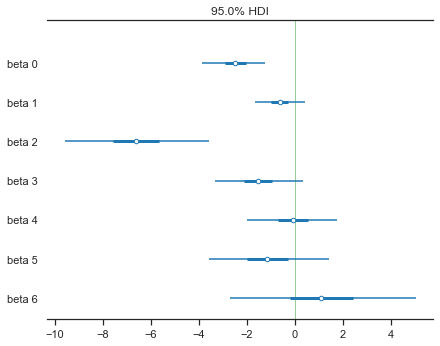

In [4]:
g = az.plot_forest(N200_fit, var_names="beta", hdi_prob=0.95, 
                   combined=True, rope=[-0,0])
plt.show()


In [33]:
az.summary(N200_fit, var_names=["alpha","beta",'sigma_u'],  hdi_prob=.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
alpha,185.698,2.765,180.307,191.065,0.124,0.087,501.0,501.0,503.0,886.0,1.01
beta[0],-2.487,0.674,-3.863,-1.240,0.015,0.010,2151.0,2151.0,2154.0,2988.0,1.00
beta[1],-0.640,0.528,-1.643,0.434,0.008,0.006,4400.0,3789.0,4413.0,4079.0,1.00
beta[2],-6.601,1.506,-9.574,-3.579,0.035,0.025,1835.0,1812.0,1829.0,2827.0,1.00
beta[3],-1.522,0.913,-3.308,0.323,0.016,0.011,3355.0,3355.0,3386.0,3674.0,1.00
beta[4],-0.085,0.952,-1.989,1.736,0.013,0.011,5698.0,3499.0,5787.0,4363.0,1.00
beta[5],-1.138,1.289,-3.592,1.439,0.019,0.014,4518.0,3954.0,4515.0,4551.0,1.00
beta[6],1.103,1.967,-2.696,5.032,0.030,0.022,4358.0,4000.0,4390.0,3990.0,1.00
sigma_u[0],0.478,0.094,0.319,0.673,0.003,0.002,1125.0,1125.0,1107.0,1757.0,1.01
sigma_u[1],0.095,0.025,0.049,0.147,0.001,0.000,2416.0,2416.0,2400.0,3498.0,1.00


## Plotting random effect of contrast on N200

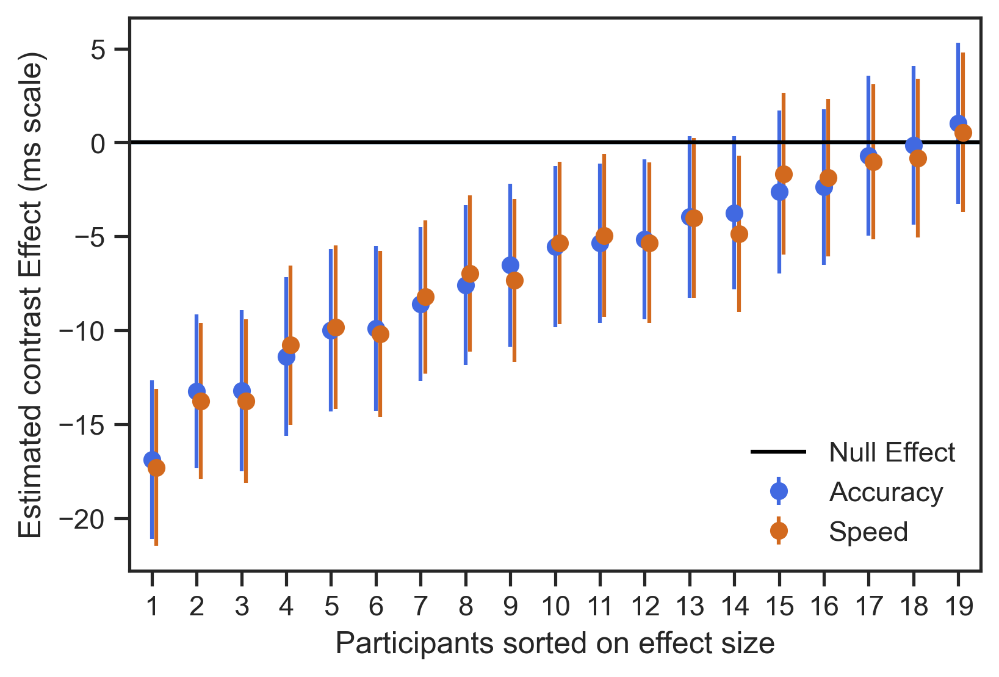

In [6]:
from scipy.special import expit

plt.figure(dpi=300)
mean_Validity = N200_fit.posterior.beta.sel(beta_dim_0=2).mean(axis=(0,1)).values 
indiv_Validity = mean_Validity + N200_fit.posterior.u.sel(u_dim_1=3).mean(axis=(0,1)).values
indiv_Validity_std = mean_Validity + N200_fit.posterior.u.sel(u_dim_1=3).std(axis=(0,1)).values

series = pd.Series(indiv_Validity)
indextosort = series.sort_values().index

plt.errorbar(x=np.arange(19)+1, y=indiv_Validity[indextosort], yerr=indiv_Validity_std, fmt='o', label="Accuracy", color='royalblue')
#plt.plot(16,ter_fit.posterior.beta.sel(b="FC").mean(axis=(0,1)), 'o', label="mean", color="b", markersize=10)
plt.hlines(0, -1, 20)

mean_Validity = N200_fit.posterior.beta.sel(beta_dim_0=2).mean(axis=(0,1)).values + N200_fit.posterior.beta.sel(beta_dim_0=4).mean(axis=(0,1)).values 
indiv_Validity = mean_Validity + N200_fit.posterior.u.sel(u_dim_1=3).mean(axis=(0,1)).values + N200_fit.posterior.u.sel(u_dim_1=5).mean(axis=(0,1)).values
indiv_Validity_std = mean_Validity +  np.std(N200_fit.posterior.u.sel(u_dim_1=3).values + N200_fit.posterior.u.sel(u_dim_1=5).values, axis=(0,1))

plt.errorbar(x=np.arange(19)+1.1, y=indiv_Validity[indextosort], yerr=indiv_Validity_std, fmt='o', label="Speed", color='chocolate')
#plt.plot(16,ter_fit.posterior.beta.sel(b="FC").mean(axis=(0,1)), 'o', label="mean", color="b", markersize=10)
plt.hlines(0, -1, 20)


#meanSATFC = ter_fit.posterior.beta.sel(b="SAT:FC").mean(axis=(0,1)).values
#indivSATFC = meanSATFC + ter_fit.posterior.u.sel(u_dim_1=4).mean(axis=(0,1)).values
plt.hlines(0, -1, 20,label="Null Effect", color="k")
plt.xlim(0.5,19.5)
plt.xticks(np.arange(19)+1)
#plt.title('Individual Effects of Validity on precision  \n\n', fontsize=15)
plt.ylabel('Estimated contrast Effect (ms scale)')
plt.legend(loc=4)
plt.xlabel('Participants sorted on effect size')
plt.show()

### Coding of effects in accuracy vs speed

Hereby I compute the difference between the predictions of the LMMs for the different levels (see method section of the manuscript) for all variables

In [13]:

data = np.random.rand(6, 1000)
chains = np.arange(6)
samples = np.arange(1000)

trans = [expit, np.exp, np.copy, np.exp, np.exp]

ms_effects = []
i = 0
for fit in [Precision_fit.posterior, RT_fit.posterior, N200_fit.posterior,DT_fit.posterior, MT_fit.posterior]:
    t = trans[i]
    intercept, bSAT, bFC, bcontrast, bSATFC, bSATcontrast, bFCcontrast, bSATFCcontrast = fit.alpha.data, fit.beta.sel(beta_dim_0=0).data,fit.beta.sel(beta_dim_0=1).data,fit.beta.sel(beta_dim_0=2).data,fit.beta.sel(beta_dim_0=3).data,fit.beta.sel(beta_dim_0=4).data,fit.beta.sel(beta_dim_0=5).data,fit.beta.sel(beta_dim_0=6).data
    bSATs = t(intercept + bSAT) - t(intercept) #SAT coded as 0/1
    bFCs = (t(intercept + bFC/2) - t(intercept - bFC/2)) #FC coded as -0.5/0.5
    bCons = (t(intercept + bcontrast/2) - t(intercept - bcontrast/2))#contrast coded as -0.5,...,0.5
    
    bSATFCs = (t(intercept + bSAT + bFC/2 + bSATFC/2) - t(intercept + bSAT - bFC/2 - bSATFC/2)) 
    bSATCons = (t(intercept + bSAT + bcontrast/2 + bSATcontrast/2) - t(intercept + bSAT - bcontrast/2 - bSATcontrast/2))
    bFCCons = (t(intercept + bFC + bcontrast/2 + bFCcontrast/2) - t(intercept + bFC + bcontrast/2 - bFCcontrast/2))
    
    bSATFCCons = (t(intercept + bSAT + bFC + bSATFC + bFCcontrast + bcontrast + bSATcontrast + bFCcontrast/2 + bSATFCcontrast/2) -\
                  t(intercept + bSAT + bFC + bSATFC + bFCcontrast + bcontrast + bSATcontrast - bFCcontrast/2 - bSATFCcontrast/2))
    
    coeff_accuracy  = xr.DataArray([bFCs, bCons, bFCCons], coords=[('beta',['FC', 'Contrast', r'FC$\times$cont.']), ("chain", chains), ("draw", samples), ])
    coeff_speed  = xr.DataArray([bSATFCs, bSATCons, bSATFCCons], coords=[('beta',['FC', 'Contrast', r'FC$\times$cont.']), ("chain", chains), ("draw", samples), ])
    SAT = xr.DataArray([bSATs], coords=[('beta',['SAT']), ("chain", chains), ("draw", samples), ])
    ms_effects.append([coeff_accuracy,coeff_speed, SAT])
    i += 1
[Precision_acc, Precision_spd, Precision_SAT], [RT_acc, RT_spd, RT_SAT], [N200_acc, N200_spd, N200_SAT], [DT_acc,DT_spd,DT_SAT], [MT_acc, MT_spd, MT_SAT] = ms_effects
[Precision_acc, Precision_spd, Precision_SAT], [RT_acc, RT_spd, RT_SAT], [N200_acc, N200_spd, N200_SAT], [DT_acc,DT_spd,DT_SAT], [MT_acc, MT_spd, MT_SAT] = [Precision_acc.rename(""), Precision_spd.rename(""), Precision_SAT.rename("")], [RT_acc.rename(""), RT_spd.rename(""), RT_SAT.rename("")], [N200_acc.rename(""), N200_spd.rename(""), N200_SAT.rename("")], [DT_acc.rename(""), DT_spd.rename(""), DT_SAT.rename("")], [MT_acc.rename(""), MT_spd.rename(""), MT_SAT.rename("")] 

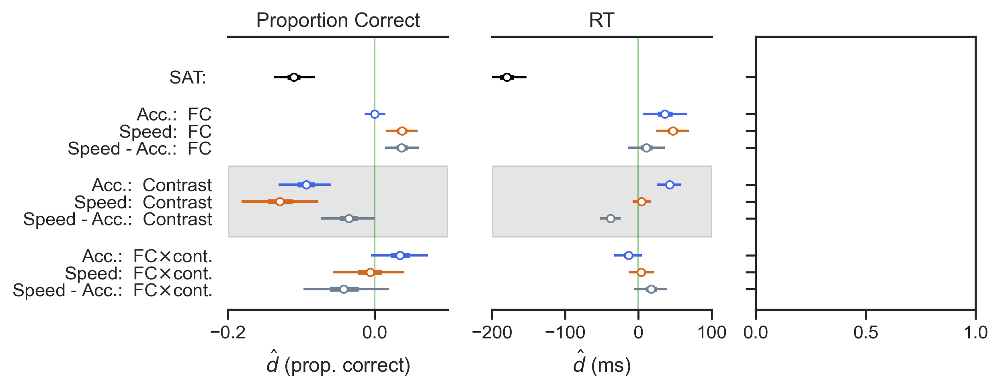

In [19]:
fig, (ax0, ax1, ax2) = plt.subplots(1,3, sharey=True, sharex=False,dpi=300, figsize=(8,3))
g = az.plot_forest([Precision_SAT.sel(beta="SAT"), Precision_acc, Precision_spd, Precision_spd-Precision_acc], model_names=['SAT','Acc.', 'Speed','Speed - Acc.'], hdi_prob=0.95, 
                   combined=True, rope=[-0,0], ax=ax0, colors=['k','royalblue','chocolate','slategray'])
g = az.plot_forest([RT_SAT.sel(beta="SAT"), RT_acc, RT_spd, RT_spd-RT_acc], model_names=['SAT','Acc.', 'Speed','Speed - Acc.'], hdi_prob=0.95, 
                   combined=True, rope=[-0,0], ax=ax1, colors=['k','royalblue','chocolate','slategray'])

ax0.set(title='Proportion Correct',xlim = (-.2, .1), xlabel=r'$\hat{d}$ (prop. correct)')
ax1.set(title='RT', xlim = (-200, 100), xlabel=r'$\hat{d}$ (ms)')

#ax2.set(title='SAT Interactions', xlabel='Effect size (log)')
plt.savefig('../LMMcoeff.png', bbox_inches='tight',dpi=300)
plt.show()


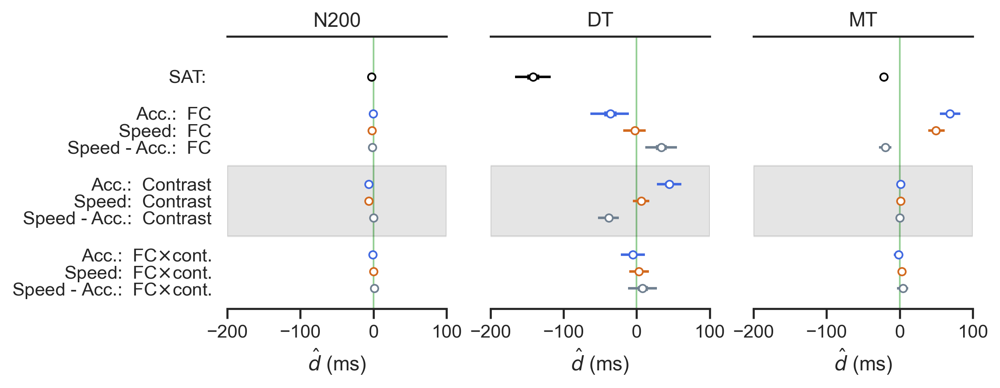

In [23]:
fig, (ax2, ax3, ax4) = plt.subplots(1,3, sharey=True, sharex=False,dpi=300, figsize=(8,3))
g = az.plot_forest([N200_SAT.sel(beta="SAT"), N200_acc, N200_spd, N200_spd-N200_acc], model_names=['SAT','Acc.', 'Speed','Speed - Acc.'], hdi_prob=0.95, 
                   combined=True, rope=[-0,0], ax=ax2, colors=['k','royalblue','chocolate','slategray'])
g = az.plot_forest([DT_SAT.sel(beta="SAT"), DT_acc, DT_spd, DT_spd-DT_acc], model_names=['SAT','Acc.', 'Speed','Speed - Acc.'], hdi_prob=0.95, 
                   combined=True, rope=[-0,0], ax=ax3, colors=['k','royalblue','chocolate','slategray'])
g = az.plot_forest([MT_SAT.sel(beta="SAT"), MT_acc, MT_spd, MT_spd-MT_acc], model_names=['SAT','Acc.', 'Speed','Speed - Acc.'], hdi_prob=0.95, 
                   combined=True, rope=[-0,0], ax=ax4, colors=['k','royalblue','chocolate','slategray'])
ax2.set(title='N200', xlim = (-200, 100), xlabel=r'$\hat{d}$ (ms)')
ax3.set(title='DT', xlim = (-200, 100), xlabel=r'$\hat{d}$ (ms)')
ax4.set(title='MT', xlim = (-200, 100), xlabel=r'$\hat{d}$ (ms)')

#ax2.set(title='SAT Interactions', xlabel='Effect size (log)')
plt.savefig('../Decomp_LMMcoeff.png', bbox_inches='tight',dpi=300)
plt.show()


Next cell I print the values of the graphic aboven, ordereding of the rows is the same as in plot : 0 = FC, 1 = contrast, 2 = FCxContrast

In [14]:
names = ["Precision_acc", "Precision_spd", "Precision_spd - Precision_acc", "RT_acc", "RT_spd", "RT_spd - RT_acc", "N200_acc", "N200_spd", "N200_spd - N200_acc",  "DT_acc", "DT_spd", "DT_spd - DT_acc","MT_acc", "MT_spd", "MT_spd - MT_acc"]
i=0
for fit in [Precision_acc, Precision_spd, Precision_spd - Precision_acc, RT_acc, RT_spd, RT_spd - RT_acc, N200_acc, N200_spd, N200_spd - N200_acc,DT_acc, DT_spd, DT_spd - DT_acc, MT_acc, MT_spd, MT_spd - MT_acc]:
    print(names[i])
    print(az.summary(fit, hdi_prob=.95)[['mean', 'sd', 'hdi_2.5%', 'hdi_97.5%']])
    print('________________________________________________________')
    i+= 1

Precision_acc
      mean     sd  hdi_2.5%  hdi_97.5%
[0]  0.000  0.007    -0.013      0.015
[1] -0.093  0.019    -0.131     -0.059
[2]  0.035  0.020    -0.005      0.073
________________________________________________________
Precision_spd
      mean     sd  hdi_2.5%  hdi_97.5%
[0]  0.037  0.011     0.015      0.059
[1] -0.128  0.027    -0.181     -0.077
[2] -0.006  0.025    -0.057      0.040
________________________________________________________
Precision_spd - Precision_acc
      mean     sd  hdi_2.5%  hdi_97.5%
[0]  0.037  0.012     0.014      0.060
[1] -0.035  0.019    -0.073      0.001
[2] -0.041  0.030    -0.097      0.020
________________________________________________________
RT_acc
       mean      sd  hdi_2.5%  hdi_97.5%
[0]  36.139  15.268     6.101     66.398
[1]  42.628   8.349    24.848     58.189
[2] -13.629   9.839   -33.054      5.040
________________________________________________________
RT_spd
       mean      sd  hdi_2.5%  hdi_97.5%
[0]  47.052  11.132    24.4

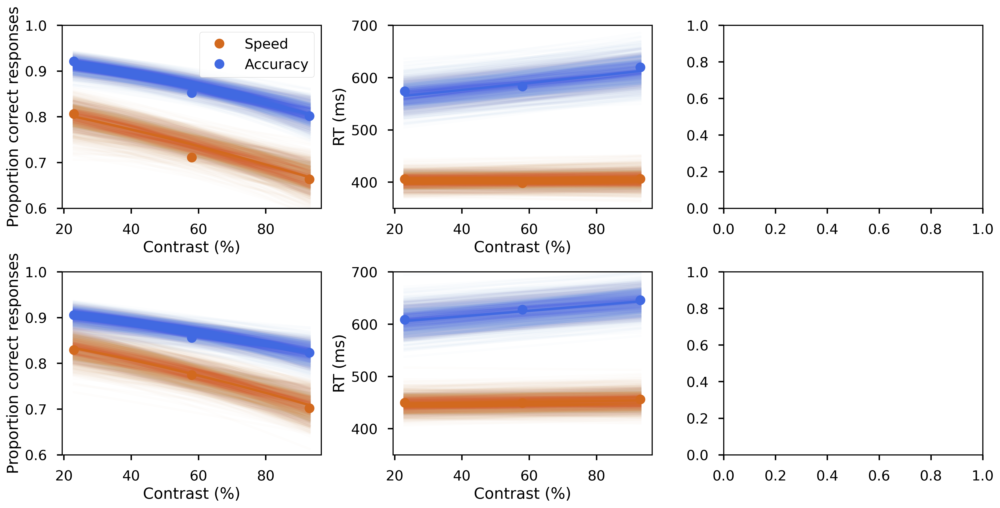

In [47]:
plt.style.use('seaborn-poster')

dv = {'response': Precision_fit, 'rt':RT_fit}
order = {'response': 0, 'rt':1}
trans = {'response': expit, 'rt':np.exp,'mt':np.exp}
upcase = {'N200':'N200','rt':'RT','mt':'MT'}
chron = ["rt"]
fig, ax = plt.subplots(2,3, sharey=False, figsize=(16,8), sharex=False, dpi=300)
x = np.linspace(1,3,100)
display_range = np.linspace(23,93,100)
contrast = np.linspace(LMEdata.contrast.min(),LMEdata.contrast.max(),100)
for y in dv.keys():
    fixeff_form = "1+SAT+FC+contrast+SAT:FC+SAT:contrast+FC:contrast+SAT:FC:contrast"#Fixed effects formula
    param_dict = {val : idx for idx, val in enumerate(fixeff_form.split('+')[1:])} 
    fit = dv[y]
    j = order[y]
    alpha, beta = fit.posterior.alpha, fit.posterior.beta
    samples,chains = fit.posterior.draw.values,fit.posterior.chain.values
    FCs = [-0.5,0.5]
    for z in np.arange(2):
        FC = FCs[z]
        for d in sample(list(samples),1000):
            c = np.random.choice(chains)
            intercept, bSAT, bFC, bcontrast, bSATFC, bSATcontrast, bFCcontrast, bSATFCcontrast =  \
                alpha.sel(draw=d, chain=c).values, beta.sel(draw=d, chain=c, beta_dim_0=param_dict["SAT"]).values,\
                beta.sel(draw=d, chain=c, beta_dim_0=param_dict["FC"]).values, beta.sel(draw=d, chain=c, beta_dim_0=param_dict["contrast"]).values,\
                beta.sel(draw=d, chain=c, beta_dim_0=param_dict["SAT:FC"]).values, beta.sel(draw=d, chain=c, beta_dim_0=param_dict["SAT:contrast"]).values,\
                beta.sel(draw=d, chain=c, beta_dim_0=param_dict["FC:contrast"]).values, beta.sel(draw=d, chain=c, beta_dim_0=param_dict["SAT:FC:contrast"]).values
            ax[z, j].plot(display_range, trans[y](intercept+bSAT*1+bFC*FC+bcontrast*contrast+bSATFC*1*FC+bSATcontrast*1*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*1*FC*contrast), color="chocolate", alpha=.01)
            ax[z, j].plot(display_range, trans[y](intercept+bSAT*0+bFC*FC+bcontrast*contrast+bSATFC*0*FC+bSATcontrast*0*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*0*FC*contrast), color="royalblue", alpha=.01)

        intercept, bSAT, bFC, bcontrast, bSATFC, bSATcontrast, bFCcontrast, bSATFCcontrast = \
            alpha.mean(axis=(0,1)).values, beta.sel(beta_dim_0=param_dict["SAT"]).mean(axis=(0,1)).values,\
            beta.sel(beta_dim_0=param_dict["FC"]).mean(axis=(0,1)).values, beta.sel(beta_dim_0=param_dict["contrast"]).mean(axis=(0,1)).values,\
            beta.sel(beta_dim_0=param_dict["SAT:FC"]).mean(axis=(0,1)).values, beta.sel(beta_dim_0=param_dict["SAT:contrast"]).mean(axis=(0,1)).values,\
            beta.sel(beta_dim_0=param_dict["FC:contrast"]).mean(axis=(0,1)).values, beta.sel(beta_dim_0=param_dict["SAT:FC:contrast"]).mean(axis=(0,1)).values
        if y in chron:
            ax[z, j].set_ylabel('%s (ms)' %upcase[y])
            dy = 'log' + y
            data = LMEdata
        elif y == 'response' :
            ax[z, j].set_ylabel('Proportion correct responses')
            data = GLMEdata
            dy = y
        else:
            ax[z, j].set_ylabel('%s (ms)' %upcase[y])
            dy = y
            data = LMEdata
        F1 = data[(data.SAT==1) & (data.FC==FC)].groupby(['participant','contrast']).mean().groupby('contrast') #Strong force only
        F2 = data[(data.SAT==0) & (data.FC==FC)].groupby(['participant','contrast']).mean().groupby('contrast') #Strong force only
        if 'log' in dy:#'royalblue','indianred'
            ax[z, j].plot(np.linspace(23,93,3), np.exp(F1[dy].mean().values),'o',color="chocolate", markeredgecolor ="k", label="Speed")
            ax[z, j].plot(np.linspace(23,93,3), np.exp(F2[dy].mean().values),'o',color="royalblue", markeredgecolor ="k", label="Accuracy")
        else : 
            ax[z, j].plot(np.linspace(23,93,3), F1[dy].mean().values,'o',color="chocolate", markeredgecolor ="k", label="Speed")
            ax[z, j].plot(np.linspace(23,93,3), F2[dy].mean().values,'o',color="royalblue", markeredgecolor ="k", label="Accuracy")
        ax[z, j].plot(display_range, trans[y](intercept+bSAT*1+bFC*FC+bcontrast*contrast+bSATFC*1*FC+bSATcontrast*1*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*1*FC*contrast), color="chocolate")
        ax[z, j].plot(display_range, trans[y](intercept+bSAT*0+bFC*FC+bcontrast*contrast+bSATFC*0*FC+bSATcontrast*0*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*0*FC*contrast), color="royalblue")
        ax[z, j].set_xlabel('Contrast (%)')
ax[0,0].legend()
ax[0,0].set_ylim(0.6,1)
ax[1,0].set_ylim(0.6,1)
ax[0,1].set_ylim(350,700)
ax[1,1].set_ylim(350,700)
plt.tight_layout()
plt.show()

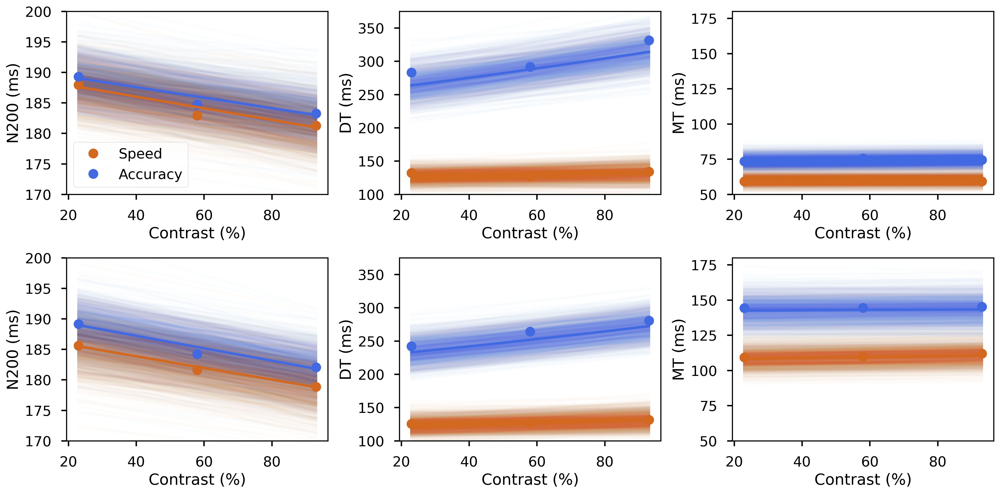

In [48]:
from scipy.special import expit
from random import sample

dv = {'N200':N200_fit,'dt':DT_fit,'mt':MT_fit}
order = { 'N200':0,'dt':1,'mt':2}
trans = {'response': expit, 'N200':np.copy,'dt':np.exp,'mt':np.exp}
upcase = {'N200':'N200','dt':'DT','mt':'MT'}
chron = ["dt","mt"]
fig, ax = plt.subplots(2,3, sharey=False, figsize=(16,8), sharex=False, dpi=300)
x = np.linspace(1,3,100)
display_range = np.linspace(23,93,100)
contrast = np.linspace(LMEdata.contrast.min(),LMEdata.contrast.max(),100)
for y in dv.keys():
    fixeff_form = "1+SAT+FC+contrast+SAT:FC+SAT:contrast+FC:contrast+SAT:FC:contrast"#Fixed effects formula
    param_dict = {val : idx for idx, val in enumerate(fixeff_form.split('+')[1:])} 
    fit = dv[y]
    j = order[y]
    alpha, beta = fit.posterior.alpha, fit.posterior.beta
    samples,chains = fit.posterior.draw.values,fit.posterior.chain.values
    FCs = [-0.5,0.5]
    for z in np.arange(2):
        FC = FCs[z]
        for d in sample(list(samples),1000):
            c = np.random.choice(chains)
            intercept, bSAT, bFC, bcontrast, bSATFC, bSATcontrast, bFCcontrast, bSATFCcontrast =  \
                alpha.sel(draw=d, chain=c).values, beta.sel(draw=d, chain=c, beta_dim_0=param_dict["SAT"]).values,\
                beta.sel(draw=d, chain=c, beta_dim_0=param_dict["FC"]).values, beta.sel(draw=d, chain=c, beta_dim_0=param_dict["contrast"]).values,\
                beta.sel(draw=d, chain=c, beta_dim_0=param_dict["SAT:FC"]).values, beta.sel(draw=d, chain=c, beta_dim_0=param_dict["SAT:contrast"]).values,\
                beta.sel(draw=d, chain=c, beta_dim_0=param_dict["FC:contrast"]).values, beta.sel(draw=d, chain=c, beta_dim_0=param_dict["SAT:FC:contrast"]).values
            ax[z, j].plot(display_range, trans[y](intercept+bSAT*1+bFC*FC+bcontrast*contrast+bSATFC*1*FC+bSATcontrast*1*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*1*FC*contrast), color="chocolate", alpha=.01)
            ax[z, j].plot(display_range, trans[y](intercept+bSAT*0+bFC*FC+bcontrast*contrast+bSATFC*0*FC+bSATcontrast*0*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*0*FC*contrast), color="royalblue", alpha=.01)

        intercept, bSAT, bFC, bcontrast, bSATFC, bSATcontrast, bFCcontrast, bSATFCcontrast = \
            alpha.mean(axis=(0,1)).values, beta.sel(beta_dim_0=param_dict["SAT"]).mean(axis=(0,1)).values,\
            beta.sel(beta_dim_0=param_dict["FC"]).mean(axis=(0,1)).values, beta.sel(beta_dim_0=param_dict["contrast"]).mean(axis=(0,1)).values,\
            beta.sel(beta_dim_0=param_dict["SAT:FC"]).mean(axis=(0,1)).values, beta.sel(beta_dim_0=param_dict["SAT:contrast"]).mean(axis=(0,1)).values,\
            beta.sel(beta_dim_0=param_dict["FC:contrast"]).mean(axis=(0,1)).values, beta.sel(beta_dim_0=param_dict["SAT:FC:contrast"]).mean(axis=(0,1)).values
        if y in chron:
            ax[z, j].set_ylabel('%s (ms)' %upcase[y])
            dy = 'log' + y
            data = LMEdata
        elif y == 'response' :
            ax[z, j].set_ylabel('Proportion correct responses')
            data = GLMEdata
            dy = y
        else:
            ax[z, j].set_ylabel('%s (ms)' %upcase[y])
            dy = y
            data = LMEdata
        F1 = data[(data.SAT==1) & (data.FC==FC)].groupby(['participant','contrast']).mean().groupby('contrast') #Strong force only
        F2 = data[(data.SAT==0) & (data.FC==FC)].groupby(['participant','contrast']).mean().groupby('contrast') #Strong force only
        if 'log' in dy:#'royalblue','indianred'
            ax[z, j].plot(np.linspace(23,93,3), np.exp(F1[dy].mean().values),'o',color="chocolate", markeredgecolor ="k", label="Speed")
            ax[z, j].plot(np.linspace(23,93,3), np.exp(F2[dy].mean().values),'o',color="royalblue", markeredgecolor ="k", label="Accuracy")
        else : 
            ax[z, j].plot(np.linspace(23,93,3), F1[dy].mean().values,'o',color="chocolate", markeredgecolor ="k", label="Speed")
            ax[z, j].plot(np.linspace(23,93,3), F2[dy].mean().values,'o',color="royalblue", markeredgecolor ="k", label="Accuracy")
        ax[z, j].plot(display_range, trans[y](intercept+bSAT*1+bFC*FC+bcontrast*contrast+bSATFC*1*FC+bSATcontrast*1*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*1*FC*contrast), color="chocolate")
        ax[z, j].plot(display_range, trans[y](intercept+bSAT*0+bFC*FC+bcontrast*contrast+bSATFC*0*FC+bSATcontrast*0*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*0*FC*contrast), color="royalblue")
        ax[z, j].set_xlabel('Contrast (%)')
ax[0,0].legend()
ax[0,0].set_ylim(170,200)
ax[1,0].set_ylim(170,200)
ax[0,1].set_ylim(100,375)
ax[1,1].set_ylim(100,375)
ax[0,2].set_ylim(50,180)
ax[1,2].set_ylim(50,180)
plt.tight_layout()
plt.show()

# WagenMaker Brown's law

Taking mean/SD ratio as SD/mean yields some estimation problems (i.e. heteroskedasticity and normality deviation)

In [30]:
summary = df.groupby(['participant','contrast','SAT']).mean()
del summary["Unnamed: 0"]
summary_std = df.groupby(['participant','contrast','SAT']).std()
del summary_std["Unnamed: 0"]
summary = pd.merge(summary, summary_std, on = ['participant','contrast','SAT'], suffixes=('','_std')).reset_index()
ratio_PMT = summary.copy()
ratio_PMT["ratio"] = ratio_PMT["prmt"]/ratio_PMT["prmt_std"]
ratio_PMT['DV'] = 'PMT'
ratio_DT = summary.copy()
ratio_DT["ratio"] = ratio_DT["dt"]/ratio_DT["dt_std"]
ratio_DT['DV'] = 'DT'
summary = ratio_PMT.append(ratio_DT)


In [31]:
import pystan
import pickle
import arviz as az
import patsy
LME = pystan.StanModel(file='MixedModels/LME.stan')

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_3535856e449ab2df75cb057031a2ad56 NOW.


In [32]:
LMEsummary = summary[['participant','contrast','SAT','DV','ratio']].copy()
LMEsummary.participant = LMEsummary.participant.replace(LMEsummary.participant.unique(), np.arange(len(LMEsummary.participant.unique()))+1)
LMEsummary.SAT = LMEsummary.SAT.replace(["accuracy","speed"], [0,1])
LMEsummary.contrast = (LMEsummary.contrast-2)/2
LMEsummary.DV = LMEsummary.DV.replace(["DT","PMT"], [0,1])
print(LMEsummary)

     participant  contrast  SAT  DV     ratio
0              1      -0.5    0   1  2.856622
1              1      -0.5    1   1  4.091140
2              1       0.0    0   1  2.837016
3              1       0.0    1   1  3.786319
4              1       0.5    0   1  2.312267
..           ...       ...  ...  ..       ...
109           19      -0.5    1   0  1.865704
110           19       0.0    0   0  1.804279
111           19       0.0    1   0  1.614043
112           19       0.5    0   0  2.053734
113           19       0.5    1   0  1.617455

[228 rows x 5 columns]


In [34]:
model_name = 'wblaw'
fixeff_form = "1 + SAT + DV + contrast + SAT:contrast + SAT:DV + DV:contrast + SAT:DV:contrast"#Fixed effects formula
raneff_form = fixeff_form#Random effects formula
fixeff = np.asarray(patsy.dmatrix(fixeff_form, LMEsummary)) #FE design matrix
raneff = np.asarray(patsy.dmatrix(raneff_form, LMEsummary))
prior_intercept = np.asarray([0,1])
priors_mu = np.repeat(0,7) #Priors on mu for FE
priors_sigma = np.repeat(1,7) # priors on sigma for FE
priors_raneff = [0,1] #Priors on RE
prior_sd = [0, 1] #priors on residual sigma

LME_data = dict(
    N = len(LMEsummary),
    P = fixeff.shape[-1], #number of pop level effects
    J = len(LMEsummary.participant.unique()),
    n_u = raneff.shape[-1],
    subj = LMEsummary.participant,
    X = fixeff,
    Z_u = raneff,
    y = LMEsummary.ratio.values,
    p_intercept = prior_intercept, p_sd = prior_sd, p_fmu = priors_mu, p_fsigma = priors_sigma, p_r = priors_raneff,
    logT = 0
)

if os.path.exists("MixedModels/FittedModels/%s.pkl"%model_name):
    with open("MixedModels/FittedModels/%s.pkl"%model_name, "rb") as f:
        data_dict = pickle.load(f)
    fit = data_dict['fit']

else:
    fit = LME.sampling(data=LME_data, iter=2000, chains=6, n_jobs=6, 
                              warmup = 1000)
    with open("MixedModels/FittedModels/%s.pkl"%model_name, "wb") as f:
        pickle.dump({'model' : LME, 'fit' : fit}, f, protocol=-1)

wb_fit_az = az.from_pystan(posterior=fit, posterior_predictive='y_hat', observed_data="y", log_likelihood='log_lik',
                                       coords={'b': fixeff_form.split('+')[1:]}, dims={'beta': ['b']})

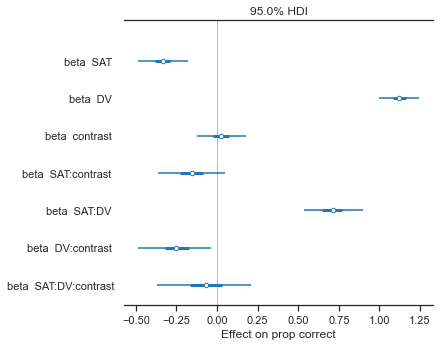

In [35]:
g = az.plot_forest(wb_fit_az, var_names=["beta"], credible_interval=0.95, 
                   combined=True, rope=[-0,0])
plt.xlabel('Effect on prop correct')
plt.show()


In [36]:
az.summary(wb_fit_az, var_names=["alpha","beta"],hdi_prob=.95)

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
alpha,1.892,0.074,1.735,2.032,0.002,0.001,1785.0,1785.0,1779.0,2871.0,1.0
beta[0],-0.336,0.076,-0.485,-0.181,0.001,0.001,2666.0,2648.0,2669.0,3425.0,1.0
beta[1],1.123,0.063,0.998,1.245,0.001,0.001,4087.0,4087.0,4092.0,4193.0,1.0
beta[2],0.024,0.076,-0.121,0.179,0.001,0.001,4753.0,3454.0,4741.0,4376.0,1.0
beta[3],-0.156,0.107,-0.365,0.047,0.001,0.001,5323.0,4620.0,5329.0,4398.0,1.0
beta[4],0.710,0.094,0.533,0.899,0.001,0.001,4279.0,4279.0,4323.0,3880.0,1.0
beta[5],-0.249,0.115,-0.485,-0.035,0.002,0.001,4413.0,4126.0,4459.0,4111.0,1.0
beta[6],-0.066,0.147,-0.368,0.207,0.002,0.002,5433.0,3491.0,5428.0,4265.0,1.0


In [37]:
data = np.random.rand(6, 1000)
chains = np.arange(6)
samples = np.arange(1000)

ms_effects = []
i = 0
fit = wb_fit_az.posterior

intercept, bSAT, bFC, bcontrast, bSATFC, bSATcontrast, bFCcontrast, bSATFCcontrast = fit.alpha.data, fit.beta.sel(b=" SAT ").data,fit.beta.sel(b=" DV ").data,fit.beta.sel(b=" contrast ").data,fit.beta.sel(b=" SAT:DV ").data,fit.beta.sel(b=" SAT:contrast ").data,fit.beta.sel(b=" DV:contrast ").data,fit.beta.sel(b= " SAT:DV:contrast").data
bSATs = bSAT #SAT coded as 0/1
bFCs = bFC #DV coded as 0/1
bCons = bcontrast#contrast coded as -0.5,...,0.5

bSATFCs = (intercept + bSAT + bFC + bSATFC) - (intercept + bSAT - bFC - bSATFC)
bSATCons = (intercept + bSAT + bcontrast/2 + bSATcontrast/2) - (intercept + bSAT - bcontrast/2 - bSATcontrast/2)
bFCCons = (intercept + bFC + bcontrast/2 + bFCcontrast/2) - (intercept + bFC + bcontrast/2 - bFCcontrast/2)

bSATFCCons = (intercept + bSAT + bFC + bSATFC + bFCcontrast + bcontrast + bSATcontrast + bFCcontrast/2 + bSATFCcontrast/2) -\
              (intercept + bSAT + bFC + bSATFC + bFCcontrast + bcontrast + bSATcontrast - bFCcontrast/2 - bSATFCcontrast/2)

coeff_accuracy  = xr.DataArray([bFCs, bCons, bFCCons], coords=[('beta',['DV', 'Contrast', r'DV$\times$cont.']), ("chain", chains), ("draw", samples), ])
coeff_speed  = xr.DataArray([bSATFCs, bSATCons, bSATFCCons], coords=[('beta',['DV', 'Contrast', r'DV$\times$cont.']), ("chain", chains), ("draw", samples), ])
SAT = xr.DataArray([bSATs], coords=[('beta',['SAT']), ("chain", chains), ("draw", samples), ])
ms_effects.append([coeff_accuracy,coeff_speed, SAT])

wb_acc, wb_spd, wb_SAT = ms_effects[0]
[wb_acc, wb_spd, wb_SAT] = [wb_acc.rename(""), wb_spd.rename(""), wb_SAT.rename("")]

In [43]:
names = ["wb_SAT", "wb_acc", "wb_spd", "wb_acc - wb_spd"]
i=0
for fit in [wb_SAT, wb_acc, wb_spd, wb_acc - wb_spd]:
    print(names[i])
    print(az.summary(fit, hdi_prob=.95)[['mean', 'sd', 'hdi_2.5%', 'hdi_97.5%']])
    print('________________________________________________________')
    i+= 1

wb_SAT
      mean     sd  hdi_2.5%  hdi_97.5%
[0] -0.336  0.076    -0.485     -0.181
________________________________________________________
wb_acc
      mean     sd  hdi_2.5%  hdi_97.5%
[0]  1.123  0.063     0.998      1.245
[1]  0.024  0.076    -0.121      0.179
[2] -0.249  0.115    -0.485     -0.035
________________________________________________________
wb_spd
      mean     sd  hdi_2.5%  hdi_97.5%
[0]  3.665  0.186     3.299      4.037
[1] -0.133  0.087    -0.299      0.043
[2] -0.315  0.124    -0.556     -0.065
________________________________________________________
wb_acc - wb_spd
      mean     sd  hdi_2.5%  hdi_97.5%
[0] -2.542  0.176    -2.884     -2.197
[1]  0.156  0.107    -0.047      0.365
[2]  0.066  0.147    -0.207      0.368
________________________________________________________


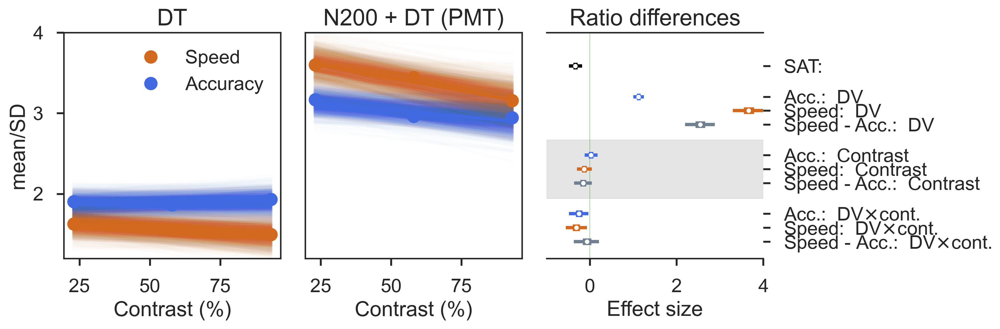

In [50]:
plt.style.use('seaborn-poster')

fig, ax = plt.subplots(1,3, sharey=False, figsize=(12,4), sharex=False, dpi=300)
x = np.linspace(1,3,100)
display_range = np.linspace(23,93,100)
contrast = np.linspace(LMEsummary.contrast.min(),LMEsummary.contrast.max(),100)

alpha, beta = wb_fit_az.posterior.alpha, wb_fit_az.posterior.beta
samples,chains = wb_fit_az.posterior.draw.values,wb_fit_az.posterior.chain.values

for z in np.arange(2):
    FC = z
    for d in sample(list(samples),1000):
        c = np.random.choice(chains)
        intercept, bSAT, bFC, bcontrast, bSATFC, bSATcontrast, bFCcontrast, bSATFCcontrast =  \
            alpha.sel(draw=d, chain=c).values, beta.sel(draw=d, chain=c, b=" SAT ").values,\
            beta.sel(draw=d, chain=c, b=" DV ").values, beta.sel(draw=d, chain=c, b=" contrast ").values,\
            beta.sel(draw=d, chain=c, b=" SAT:DV ").values, beta.sel(draw=d, chain=c, b=" SAT:contrast ").values,\
            beta.sel(draw=d, chain=c, b=" DV:contrast ").values, beta.sel(draw=d, chain=c, b=" SAT:DV:contrast").values
        ax[z].plot(display_range, intercept+bSAT*1+bFC*FC+bcontrast*contrast+bSATFC*1*FC+bSATcontrast*1*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*1*FC*contrast, color="chocolate", alpha=.01)
        ax[z].plot(display_range, intercept+bSAT*0+bFC*FC+bcontrast*contrast+bSATFC*0*FC+bSATcontrast*0*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*0*FC*contrast, color="royalblue", alpha=.01)

    intercept, bSAT, bFC, bcontrast, bSATFC, bSATcontrast, bFCcontrast, bSATFCcontrast = \
        alpha.mean(axis=(0,1)).values, beta.sel(b=" SAT ").mean(axis=(0,1)).values,\
        beta.sel(b=" DV ").mean(axis=(0,1)).values, beta.sel(b=" contrast ").mean(axis=(0,1)).values,\
        beta.sel(b=" SAT:DV ").mean(axis=(0,1)).values, beta.sel(b=" SAT:contrast ").mean(axis=(0,1)).values,\
        beta.sel(b=" DV:contrast ").mean(axis=(0,1)).values, beta.sel(b=" SAT:DV:contrast").mean(axis=(0,1)).values

    F1 = LMEsummary[(LMEsummary.SAT==1) & (LMEsummary.DV==FC)].groupby(['participant','contrast']).mean().groupby('contrast') #Strong force only
    F2 = LMEsummary[(LMEsummary.SAT==0) & (LMEsummary.DV==FC)].groupby(['participant','contrast']).mean().groupby('contrast') #Strong force only
    ax[z].plot(np.linspace(23,93,3), F1.ratio.mean().values,'o',color="chocolate", markeredgecolor ="k", label="Speed")
    ax[z].plot(np.linspace(23,93,3), F2.ratio.mean().values,'o',color="royalblue", markeredgecolor ="k", label="Accuracy")
    ax[z].plot(display_range, intercept+bSAT*1+bFC*FC+bcontrast*contrast+bSATFC*1*FC+bSATcontrast*1*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*1*FC*contrast, color="chocolate")
    ax[z].plot(display_range, intercept+bSAT*0+bFC*FC+bcontrast*contrast+bSATFC*0*FC+bSATcontrast*0*contrast+bFCcontrast*FC*contrast+bSATFCcontrast*0*FC*contrast, color="royalblue")
ax[0].legend()
ax[0].set(title='DT', xlabel='Contrast (%)', ylabel="mean/SD",ylim=(1.2,4))
ax[1].set(title='N200 + DT (PMT)', xlabel='Contrast (%)', ylabel="", yticks=[], ylim=(1.2,4))


g = az.plot_forest([wb_SAT.sel(beta="SAT"), wb_acc, wb_spd, wb_spd-wb_acc], model_names=['SAT','Acc.', 'Speed','Speed - Acc.'], hdi_prob=0.95, 
                   combined=True, rope=[-0,0], ax=ax[2], colors=['k','royalblue','chocolate','slategray'],markersize=5)
ax[2].set(title='Ratio differences',xlim = (-1,4), xlabel='Effect size')
ax[2].yaxis.set_label_position("right")
ax[2].yaxis.tick_right()
plt.tight_layout()
plt.show()

### Checking assumptions of LMMs

<AxesSubplot:xlabel='y / y_hat'>

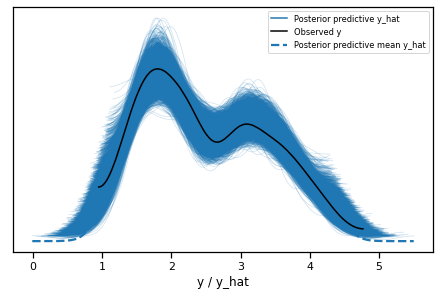

In [25]:
az.plot_ppc(wb_fit_az, data_pairs = {'y' : 'y_hat'})

In [26]:
def plot_resid(fit):
    from scipy.stats import probplot
    observed = fit.observed_data.y.values 
    predicted = np.mean(fit.posterior_predictive.y_hat.values, axis=(0,1)) 
    residuals = observed - predicted
    f, (ax1, ax2) = plt.subplots(1, 2, sharey=False, figsize=[15,7])
    probplot(residuals, dist="norm", plot=ax1)
    ax2.plot(np.sort(observed, kind='mergesort'), residuals, '.')
    ax2.plot([observed.min(), observed.max()],[0,0],linestyle='--', color='r')

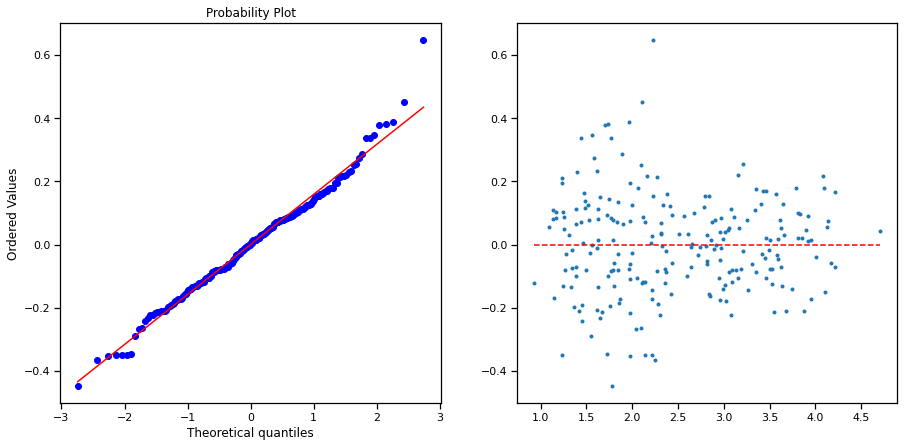

In [35]:
plot_resid(wb_fit_az)

# DDM modelling


# Recovering regression HDDM fits

In [3]:
RTstats = pd.read_csv('DDM/RT_15000_stats.csv', index_col=0)
RTtraces = pd.read_csv('DDM/RT_15000_traces.csv', index_col=0)

RTstats_reg = pd.read_csv('DDM/reg_RT_4000_stats.csv', index_col=0)
RTtraces_reg = pd.read_csv('DDM/reg_RT_4000_traces.csv', index_col=0)

#Applying invlogit on starting point to recover original scale
def inv_logit(x):
    return np.exp(x) / (1 + np.exp(x))

RTtraces_reg["z_Intercept"] = inv_logit(RTtraces_reg["z_Intercept_trans"].values)
RTtraces_reg["z_FC"] = inv_logit(RTtraces_reg["z_Intercept_trans"].values + RTtraces_reg["z_FC"].values/2) - inv_logit(RTtraces_reg["z_Intercept_trans"].values - RTtraces_reg["z_FC"].values/2)

# Summary table for RT

In [4]:
parameters = ["v_Intercept",'v_contrast','a_Intercept','a_SAT','a_FC','a_SAT:FC','z_Intercept','z_FC','t_Intercept','t_SAT','t_FC','t_contrast','t_SAT:FC','t_SAT:contrast','t_FC:contrast','t_SAT:FC:contrast']

summary_df_RT = pd.DataFrame()

for v in parameters:
    summary_df_RT = summary_df_RT.append(RTstats_reg[RTstats_reg.index.str.contains(v+"$")])

In [5]:
summary_df_RT


,mean,std,2.5q,25q,50q,75q,97.5q,mc err
v_Intercept,-1.854224,0.096625,-2.047982,-1.917027,-1.855199,-1.792606,-1.657487,0.002435
v_contrast,1.006425,0.175701,0.663335,0.894565,1.002290,1.117002,1.364233,0.003402
a_Intercept,1.155600,0.035119,1.087678,1.133405,1.154433,1.177970,1.227866,0.000790
a_SAT,-0.415519,0.038243,-0.492716,-0.440026,-0.415275,-0.390186,-0.341607,0.000869
a_FC,-0.030682,0.042243,-0.115865,-0.057779,-0.029623,-0.003013,0.052213,0.001034
a_SAT:FC,0.053640,0.048095,-0.044328,0.023524,0.054213,0.084922,0.147172,0.001095
z_Intercept,0.519439,0.013751,0.492973,0.510078,0.519493,0.528837,0.546551,0.000478
z_FC,0.012263,0.008586,-0.004270,0.006549,0.012209,0.017881,0.029247,0.000188
t_Intercept,0.400162,0.012289,0.377036,0.392055,0.399829,0.407961,0.426082,0.000220
t_SAT,-0.067773,0.008500,-0.085203,-0.073070,-0.067830,-0.062291,-0.050766,0.000180


# Comparing DDM inferences versus physiology

## Table of the effects

In [6]:
parameters = ["v_Intercept",'v_contrast','a_Intercept','a_SAT','a_FC','a_SAT:FC','z_Intercept','z_FC','t_Intercept','t_SAT','t_FC','t_contrast','t_SAT:FC','t_SAT:contrast','t_FC:contrast','t_SAT:FC:contrast']

RTtraces_reg_eff = RTtraces_reg

RTtraces_reg_eff['a_FC:Speed'] = RTtraces_reg_eff["a_FC"] + RTtraces_reg_eff['a_SAT:FC']

RTtraces_reg['t_FC:Speed'] = RTtraces_reg_eff["t_FC"] + RTtraces_reg_eff['t_SAT:FC']
RTtraces_reg_eff['t_contrast:Speed'] = RTtraces_reg_eff["t_contrast"] + RTtraces_reg_eff['t_SAT:contrast']
RTtraces_reg_eff['t_FC:contrast:Speed'] = RTtraces_reg_eff["t_FC:contrast"] + RTtraces_reg_eff['t_SAT:FC:contrast']

name,mean,cri = [],[],[]
for variable in ["v_Intercept",'v_contrast','a_Intercept','a_SAT','a_FC','a_FC:Speed','z_Intercept','z_FC','t_Intercept','t_SAT','t_FC','t_contrast','t_FC:Speed','t_contrast:Speed','t_FC:contrast','t_FC:contrast:Speed','t_SAT:FC','t_SAT:contrast','t_SAT:FC:contrast','a_SAT:FC']:
    name.append(variable)
    mean.append(np.mean(RTtraces_reg_eff[variable]))
    cri.append(az.hdi(RTtraces_reg_eff[variable].values, hdi_prob=0.95))
    
summary_eff_RT = pd.DataFrame({'name':name, 'mean':mean, 'cri':cri})
summary_eff_RT[['2.5','97.5']] = pd.DataFrame(summary_eff_RT.cri.tolist(),
                                 columns = ['2.5','97.5'])
del summary_eff_RT['cri']

In [7]:
summary_eff_RT

,name,mean,2.5,97.5
0,v_Intercept,-1.854224,-2.055308,-1.667220
1,v_contrast,1.006425,0.636194,1.335094
2,a_Intercept,1.155600,1.085517,1.224782
3,a_SAT,-0.415519,-0.491904,-0.341540
4,a_FC,-0.030682,-0.116991,0.050704
5,a_FC:Speed,0.022958,-0.090830,0.149794
6,z_Intercept,0.519621,0.493386,0.547473
7,z_FC,0.003059,-0.000936,0.007357
8,t_Intercept,0.400162,0.376705,0.425494
9,t_SAT,-0.067773,-0.083272,-0.049180


# Factor plot on parameters

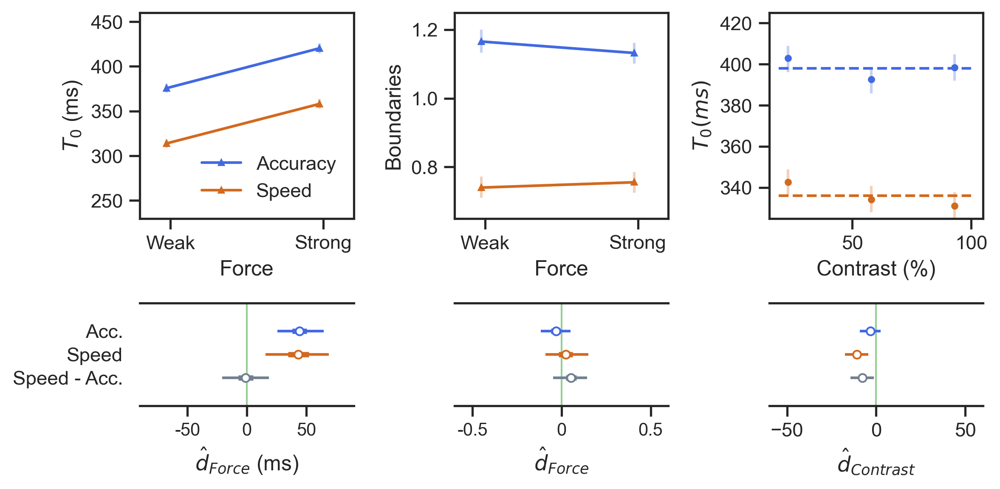

In [32]:
import matplotlib.pyplot as plt
from matplotlib import gridspec
def factorplot(F1, F2, plot_obj, label,c,ls='-',jitter=-.025):
    m_acc, m_spd =  np.mean(F1),np.mean(F2)
    b_acc, u_acc = az.hpd(F1.values, .65)
    b_spd, u_spd = az.hpd(F2.values, .65)

    plot_obj.plot(np.array([1,2])+jitter, [m_acc, m_spd],
             ls=ls, marker="^", c=c, label=label, markersize=3)
    plot_obj.errorbar(np.array([1,2])+jitter, [m_acc, m_spd],
             yerr = np.array([np.abs(m_acc-np.asarray([b_acc, u_acc])),np.abs(m_spd-np.asarray([b_spd, u_spd]))]),
             ls=ls, marker="^", c=c, alpha=.3, markersize=3)



fig = plt.figure(dpi=300, figsize=(8, 4))
spec = gridspec.GridSpec(ncols=3, nrows=2,
                         height_ratios=[1, .5])

ax0 = fig.add_subplot(spec[1])
ax1 = fig.add_subplot(spec[0])
ax2 = fig.add_subplot(spec[4])
ax3 = fig.add_subplot(spec[3])
ax4 = fig.add_subplot(spec[2])
ax5 = fig.add_subplot(spec[5])

factorplot(RTtraces["a(low.accuracy)"], RTtraces["a(high.accuracy)"], ax0, "Accuracy",'royalblue')
factorplot(RTtraces["a(low.speed)"], RTtraces["a(high.speed)"], ax0, "Speed",'chocolate')

ax0.set_ylim(0.65, 1.25)
ax1.set_ylim(0.65, 1.25)

RTtraces_reg["a_FC_spd_ms"] = RTtraces_reg["a_FC"] + RTtraces_reg["a_SAT:FC"]

az.plot_forest([np.array(RTtraces_reg["a_FC"]),np.array(RTtraces_reg["a_FC_spd_ms"]),np.array(RTtraces_reg["a_FC_spd_ms"]) - np.array(RTtraces_reg["a_FC"])], 
               ax=ax2, colors=['royalblue','chocolate','slategray'], hdi_prob=.95, rope=[0,0])

ax0.set_xticks([1,2])
ax0.set_xticklabels(["Weak","Strong"])
ax0.set_xlim(0.8,2.2)
ax0.set_ylabel('Boundaries')
ax0.set_xlabel('Force')

ax2.set(title="", xlim=(-0.6,0.6),xlabel =r'$\hat{d}_{Force}$', yticklabels=["","",""])

ax2.set_xticklabels([-.5,-.5,0,.5], fontsize=10)


factorplot(np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(low.accuracy")],axis=1)*1000, np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(high.accuracy")],axis=1)*1000, ax1, "Accuracy",'royalblue')
factorplot(np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(low.speed")],axis=1)*1000, np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(high.speed")],axis=1)*1000, ax1, "Speed",'chocolate')

#RTtraces_reg["a_FC"].plot(kind='density', color='purple', label='RT',ax=ax2)RTstats_reg
#PMTtraces_reg["a_FC"].plot(kind='density', color='indianred',label='PMT', ax=ax3)

#RTtraces_reg["a_FC_spd_ms"].plot(kind='density', color='purple', label='RT',ax=ax2,ls=':')
#PMTtraces_reg["a_FC_spd_ms"].plot(kind='density', color='indianred',label='PMT', ax=ax3,ls=':')

#ax3.vlines(0, ax3.get_ylim()[0],ax3.get_ylim()[1], ls='--', color='k')
#ax2.vlines(0, ax2.get_ylim()[0],ax2.get_ylim()[1], ls='--', color='k')
az.plot_forest([np.array(RTtraces_reg["t_FC"]*1000),np.array(RTtraces_reg["t_FC:Speed"]*1000),np.array(RTtraces_reg["t_FC:Speed"]*1000) - np.array(RTtraces_reg["t_FC"]*1000)], 
               ax=ax3, colors=['royalblue','chocolate','slategray'], hdi_prob=.95, rope=[0,0])

ax1.set_xticks([1,2])
ax1.set_xticklabels(["Weak","Strong"])
ax1.set_xlim(0.8,2.2)
ax1.set_xlabel('Force')
ax1.legend(loc=4)

ax3.set(title="", xlim=(-90,90),xlabel =r'$\hat{d}_{Force}$ (ms)', yticklabels=["Speed - Acc.","Speed","Acc."])

ax1.set_ylabel(r'$T_{0}$ (ms)')
ax1.set_ylim(230, 460)

ax3.set_xticklabels([-25,-50,0,50], fontsize=10)


############# contrast

un,deux,trois = np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.accuracy.1")],axis=1), np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.accuracy.2")],axis=1),np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.accuracy.3")],axis=1)
m_un,m_deux,m_trois = np.mean(un),np.mean(deux),np.mean(trois)
b_un, u_un = az.hpd(un.values, .65)
b_deux, u_deux = az.hpd(deux.values, .65)
b_trois, u_trois = az.hpd(trois.values, .65)

ax4.errorbar(np.linspace(23,93,3), np.asarray([m_un,m_deux,m_trois])*1000,
            #yerr = np.transpose(np.array([np.abs(m_un-np.asarray([b_un, u_un])),np.abs(m_deux-np.asarray([b_deux, u_deux])),np.abs(m_trois-np.asarray([b_trois, u_trois])),np.abs(m_quatre-np.asarray([b_quatre, u_quatre])),np.abs(m_cinq-np.asarray([b_cinq, u_cinq])),np.abs(m_six-np.asarray([b_six, u_six]))])),
             fmt='.', c="royalblue", label='Accuracy')
ax4.errorbar(np.linspace(23,93,3), np.asarray([m_un,m_deux,m_trois])*1000,
            yerr = np.transpose(np.array([np.abs(m_un-np.asarray([b_un, u_un])),np.abs(m_deux-np.asarray([b_deux, u_deux])),np.abs(m_trois-np.asarray([b_trois, u_trois]))]))*1000,
            fmt='.', c="royalblue", label='', alpha=.3)
ax4.hlines(np.mean(np.asarray([m_un,m_deux,m_trois]))*1000,19,100,ls='--',color='royalblue')
#ax4.plot(np.linspace(23,93,100), (predicted_V1-np.mean(predicted_V1))+np.mean(np.asarray([m_un,m_deux,m_trois,m_quatre,m_cinq,m_six]))*1000,c="k")

################################""################################"################################"################################"

un,deux,trois = np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.speed.1")],axis=1), np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.speed.2")],axis=1),np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.speed.3")],axis=1)
m_un,m_deux,m_trois = np.mean(un),np.mean(deux),np.mean(trois)
b_un, u_un = az.hpd(un.values, .65)
b_deux, u_deux = az.hpd(deux.values, .65)
b_trois, u_trois = az.hpd(trois.values, .65)

ax4.errorbar(np.linspace(23,93,3), np.asarray([m_un,m_deux,m_trois])*1000,
            #yerr = np.transpose(np.array([np.abs(m_un-np.asarray([b_un, u_un])),np.abs(m_deux-np.asarray([b_deux, u_deux])),np.abs(m_trois-np.asarray([b_trois, u_trois])),np.abs(m_quatre-np.asarray([b_quatre, u_quatre])),np.abs(m_cinq-np.asarray([b_cinq, u_cinq])),np.abs(m_six-np.asarray([b_six, u_six]))])),
             fmt='.', c="chocolate", label='Speed')
ax4.errorbar(np.linspace(23,93,3), np.asarray([m_un,m_deux,m_trois])*1000,
            yerr = np.transpose(np.array([np.abs(m_un-np.asarray([b_un, u_un])),np.abs(m_deux-np.asarray([b_deux, u_deux])),np.abs(m_trois-np.asarray([b_trois, u_trois]))]))*1000,
            fmt='.', c="chocolate", label='', alpha=.3)
#ax4.plot(np.linspace(23,93,100), (predicted_V1-np.mean(predicted_V1))+np.mean(np.asarray([m_un,m_deux,m_trois,m_quatre,m_cinq,m_six]))*1000,c="chocolate")
ax4.hlines(np.mean(np.asarray([m_un,m_deux,m_trois]))*1000,19,100,ls='--',color='chocolate')

az.plot_forest([np.array(RTtraces_reg_eff["t_contrast"])*1000,np.array(RTtraces_reg_eff["t_contrast:Speed"])*1000,np.array(RTtraces_reg_eff["t_contrast:Speed"])*1000 - np.array(RTtraces_reg_eff["t_contrast"])*1000], 
               ax=ax5, colors=['royalblue','chocolate',"slategray"], hdi_prob=.95, rope=[0,0])


ax4.set_ylabel(r'$T_{0} (ms)$')
ax4.set_xlabel('Contrast (%)')
ax5.set_xlabel(r'$\hat{d}_{Contrast}$')
ax5.set(title="", xlim=(-60,60),xlabel =r'$\hat{d}_{Contrast}$', yticklabels=["","",""])

ax4.set_ylim(325, 425)
ax4.set_xlim(15,105)

plt.tight_layout()
plt.show()

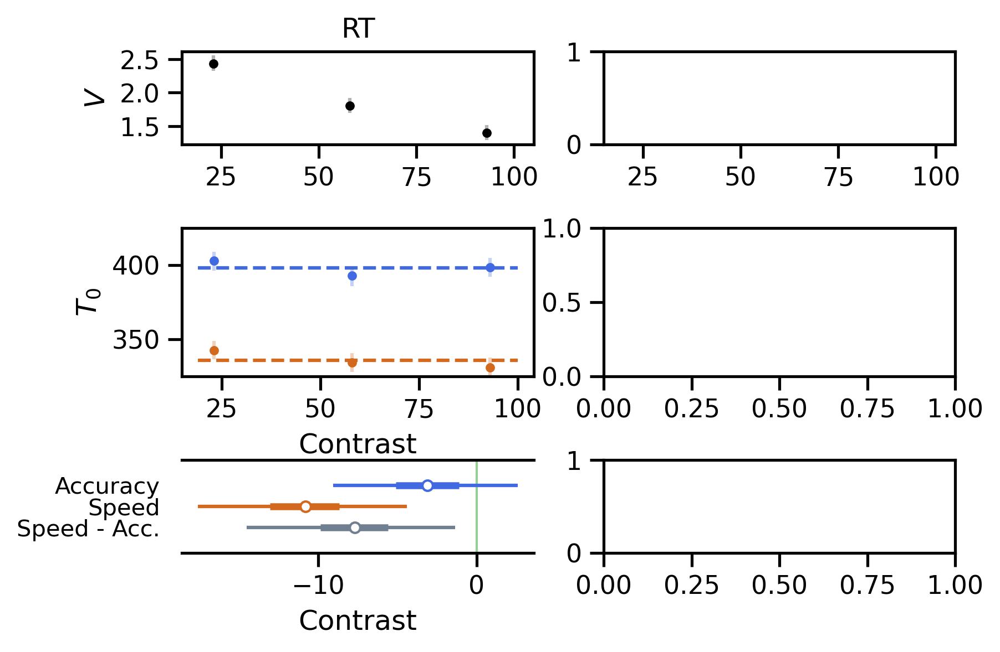

In [58]:
import matplotlib.pyplot as plt
from matplotlib import gridspec

def factorplot(F1, F2, plot_obj, label,c,ls='-'):
    m_acc, m_spd =  np.mean(F1),np.mean(F2)
    b_acc, u_acc = az.hpd(F1.values, .65)
    b_spd, u_spd = az.hpd(F2.values, .65)

    plot_obj.plot([1.02,2.02], [m_acc, m_spd],
             ls=ls, marker="^", c=c, label=label, alpha=.3)


fig = plt.figure(dpi=300)
spec = gridspec.GridSpec(ncols=2, nrows=3, hspace=.75,
                         height_ratios=[2.5, 4, 2.5])

ax0 = fig.add_subplot(spec[2])
ax1 = fig.add_subplot(spec[3])
ax2 = fig.add_subplot(spec[4])
ax3 = fig.add_subplot(spec[5])
ax4 = fig.add_subplot(spec[0])
ax5 = fig.add_subplot(spec[1])


un,deux,trois = np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.accuracy.1")],axis=1), np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.accuracy.2")],axis=1),np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.accuracy.3")],axis=1)
m_un,m_deux,m_trois = np.mean(un),np.mean(deux),np.mean(trois)
b_un, u_un = az.hpd(un.values, .65)
b_deux, u_deux = az.hpd(deux.values, .65)
b_trois, u_trois = az.hpd(trois.values, .65)

ax0.errorbar(np.linspace(23,93,3), np.asarray([m_un,m_deux,m_trois])*1000,
            #yerr = np.transpose(np.array([np.abs(m_un-np.asarray([b_un, u_un])),np.abs(m_deux-np.asarray([b_deux, u_deux])),np.abs(m_trois-np.asarray([b_trois, u_trois])),np.abs(m_quatre-np.asarray([b_quatre, u_quatre])),np.abs(m_cinq-np.asarray([b_cinq, u_cinq])),np.abs(m_six-np.asarray([b_six, u_six]))])),
             fmt='.', c="royalblue", label='Accuracy')
ax0.errorbar(np.linspace(23,93,3), np.asarray([m_un,m_deux,m_trois])*1000,
            yerr = np.transpose(np.array([np.abs(m_un-np.asarray([b_un, u_un])),np.abs(m_deux-np.asarray([b_deux, u_deux])),np.abs(m_trois-np.asarray([b_trois, u_trois]))]))*1000,
            fmt='.', c="royalblue", label='', alpha=.3)
ax0.hlines(np.mean(np.asarray([m_un,m_deux,m_trois]))*1000,19,100,ls='--',color='royalblue')
#ax0.plot(np.linspace(23,93,100), (predicted_V1-np.mean(predicted_V1))+np.mean(np.asarray([m_un,m_deux,m_trois,m_quatre,m_cinq,m_six]))*1000,c="k")

################################""################################"################################"################################"

un,deux,trois = np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.speed.1")],axis=1), np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.speed.2")],axis=1),np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("t\(.*.speed.3")],axis=1)
m_un,m_deux,m_trois = np.mean(un),np.mean(deux),np.mean(trois)
b_un, u_un = az.hpd(un.values, .65)
b_deux, u_deux = az.hpd(deux.values, .65)
b_trois, u_trois = az.hpd(trois.values, .65)

ax0.errorbar(np.linspace(23,93,3), np.asarray([m_un,m_deux,m_trois])*1000,
            #yerr = np.transpose(np.array([np.abs(m_un-np.asarray([b_un, u_un])),np.abs(m_deux-np.asarray([b_deux, u_deux])),np.abs(m_trois-np.asarray([b_trois, u_trois])),np.abs(m_quatre-np.asarray([b_quatre, u_quatre])),np.abs(m_cinq-np.asarray([b_cinq, u_cinq])),np.abs(m_six-np.asarray([b_six, u_six]))])),
             fmt='.', c="chocolate", label='Speed')
ax0.errorbar(np.linspace(23,93,3), np.asarray([m_un,m_deux,m_trois])*1000,
            yerr = np.transpose(np.array([np.abs(m_un-np.asarray([b_un, u_un])),np.abs(m_deux-np.asarray([b_deux, u_deux])),np.abs(m_trois-np.asarray([b_trois, u_trois]))]))*1000,
            fmt='.', c="chocolate", label='', alpha=.3)
#ax0.plot(np.linspace(23,93,100), (predicted_V1-np.mean(predicted_V1))+np.mean(np.asarray([m_un,m_deux,m_trois,m_quatre,m_cinq,m_six]))*1000,c="chocolate")
ax0.hlines(np.mean(np.asarray([m_un,m_deux,m_trois]))*1000,19,100,ls='--',color='chocolate')

az.plot_forest([np.array(RTtraces_reg_eff["t_contrast"])*1000,np.array(RTtraces_reg_eff["t_contrast:Speed"])*1000,np.array(RTtraces_reg_eff["t_contrast:Speed"])*1000 - np.array(RTtraces_reg_eff["t_contrast"])*1000], 
               ax=ax2, colors=['royalblue','chocolate',"slategray"], hdi_prob=.95, rope=[0,0])


ax0.set_ylabel(r'$T_{0}$')
ax0.set_xlabel('Contrast')
ax2.set_xlabel('Contrast')

ax0.set_ylim(325, 425)


ax4.set_title('RT')


un,deux,trois = np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("v\(1")],axis=1), np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("v\(2")],axis=1),np.mean(RTtraces.iloc[:,RTtraces.columns.str.contains("v\(3")],axis=1)
m_un,m_deux,m_trois = np.mean(un),np.mean(deux),np.mean(trois)
b_un, u_un = az.hpd(un.values, .65)
b_deux, u_deux = az.hpd(deux.values, .65)
b_trois, u_trois = az.hpd(trois.values, .65)

ax4.errorbar(np.linspace(23,93,3), np.asarray([m_un,m_deux,m_trois]),
            #yerr = np.transpose(np.array([np.abs(m_un-np.asarray([b_un, u_un])),np.abs(m_deux-np.asarray([b_deux, u_deux])),np.abs(m_trois-np.asarray([b_trois, u_trois])),np.abs(m_quatre-np.asarray([b_quatre, u_quatre])),np.abs(m_cinq-np.asarray([b_cinq, u_cinq])),np.abs(m_six-np.asarray([b_six, u_six]))])),
             fmt='.', c="k")
ax4.errorbar(np.linspace(23,93,3), np.asarray([m_un,m_deux,m_trois]),
            yerr = np.transpose(np.array([np.abs(m_un-np.asarray([b_un, u_un])),np.abs(m_deux-np.asarray([b_deux, u_deux])),np.abs(m_trois-np.asarray([b_trois, u_trois]))])),
            fmt='.', c="k", label='', alpha=.3)
ax4.set_ylabel(r'$V$')

ax2.set_title('')
ax2.set_yticklabels(["Speed - Acc.","Speed","Accuracy"], fontsize=10)
ax4.set_xlim(15,105)
ax5.set_xlim(15,105)
plt.tight_layout()
plt.savefig('../V1DDM.png', bbox_inches='tight')
plt.show()

# Correlation between parameters and physiology

## Estimated process value correlations

### Extract MDT and t0

In [ ]:

%R library(rtdists)
__MDTs, __t0s = [],[]
for iteration in traces[-1500:].iterrows():
    _MDTs,_t0s = [],[]
    print(iteration[0])
    for condition in ['low.accuracy','high.accuracy','low.speed','high.speed']:#For each SATxFC cell
        MDTs,t0s = [],[]
        for contrast in np.arange(3)+1: #For each contrast level
            sv = iteration[1][iteration[1].index.str.contains('sv')].values[0] #sv,szr,et st, inter-trial parameter varibility are the same for all participants
            szr = iteration[1][iteration[1].index.str.contains('sz\(%s\)'%condition.split('.')[1])].values[0]
            st = iteration[1][iteration[1].index.str.contains('st$')].values[0]
            MDT,t0_ = [],[]
            for part in data.participant.unique():#For each participant
                t0 = iteration[1][iteration[1].index.str.contains('t_subj\(%s.%s\).%s'%(condition,contrast,part))].values[0]
                a = iteration[1][iteration[1].index.str.contains('a_subj\(%s\).%s'%(condition,part))].values[0]
                v = iteration[1][iteration[1].index.str.contains('v_subj\(%s\).%s'%(contrast,part))].values[0]
                zr = iteration[1][iteration[1].index.str.contains('z_subj_trans\(%s\).%s'%(condition.split('.')[0],part))].values[0]
                params = [a,v,inv_logit(zr),sv,szr,t0,st] 
                %R -i params
                %R params = as.numeric(params)
                %R dts = rdiffusion(1000, a=params[1], v=params[2], z=params[3]*params[1], d=0, sz=params[5]*params[3], sv=params[4], t0=0, st0=0)
                %R mean_dts_c = mean(dts[dts$response == "upper", "rt"])
                %R -o mean_dts_c
                MDT.append(mean_dts_c[0])
                t0_.append(t0)
            MDTs.append(MDT)
            t0s.append(t0_)
        #MDTs = np.mean(MDTs, axis=0)#Average over contrast levels
        _MDTs.append(MDTs)#sotre iteration values
        _t0s.append(t0s)#sotre iteration values
    __MDTs.append(_MDTs)
    __t0s.append(_t0s)

In [ ]:
dfMDT = pd.DataFrame({'MDT':np.asarray(__MDTs).flatten(), 'iteration':np.repeat(np.arange(1500), 3*4*19), 
                      'participant':np.tile(np.arange(19)+1,1500*4*3), 
                      'condition':np.tile(np.array([np.repeat('low.accuracy',19*3),np.repeat('high.accuracy',19*3),np.repeat('low.speed',19*3),np.repeat('high.speed',19*3)]).flatten(),1500),
                     'contrast':np.tile(np.array([np.repeat(1,19),np.repeat(2,19),np.repeat(3,19)]).flatten(),1500*4)})
dfMDT[['FC','SAT']] = pd.DataFrame(dfMDT.condition.str.split('.',1).tolist(),
                                 columns = ['FC','SAT'])
dfMDT.participant = dfMDT.participant.replace(dfMDT.participant.unique(),data.participant.unique())
dfDDM = dfMDT
dfDDM['t0'] =dfDDM.t0*1000
dfDDM['MDT'] = dfDDM.MDT*1000
dfDDM.FC = dfDDM.FC.replace(['low','high'],[1,2])
df['ter'] = df.mt + df.N200
dfDDM.to_csv('dfDDM.csv')

In [59]:
dfDDM = pd.read_csv('dfDDM.csv')
df['ter'] = df.mt + df.N200

In [60]:
%%R 

### Plausible values ----

posteriorRho <- function(r, n, npoints=100, kappa=1)
  # Code provided by Dora Matzke, March 2016, from Alexander Ly
  # Reformatted into a single funciton. kappa=1 implies uniform prior.
  # Picks smart grid of npoints points concentrating around the density peak. 
  # Returns approxfun for the unnormalized density. 
{

  .bf10Exact <- function(n, r, kappa=1) {
	  # Ly et al 2015
	  # This is the exact result with symmetric beta prior on rho
	  # with parameter alpha. If kappa = 1 then uniform prior on rho
	  #
	  if (n <= 2){
		  return(1)
	  } else if (any(is.na(r))){
		  return(NaN)
	  }
	  # TODO: use which
	  check.r <- abs(r) >= 1 # check whether |r| >= 1
	  if (kappa >= 1 && n > 2 && check.r) {
		  return(Inf)
	  }

	  log.hyper.term <- log(hypergeo::genhypergeo(U=c((n-1)/2, (n-1)/2), 
	                                              L=((n+2/kappa)/2), z=r^2))
	  log.result <- log(2^(1-2/kappa))+0.5*log(pi)-lbeta(1/kappa, 1/kappa)+
		lgamma((n+2/kappa-1)/2)-lgamma((n+2/kappa)/2)+log.hyper.term
	  real.result <- exp(Re(log.result))
	  return(real.result)
  }
  
  .jeffreysApproxH <- function(n, r, rho) {	
	  result <- ((1 - rho^(2))^(0.5*(n - 1)))/((1 - rho*r)^(n - 1 - 0.5))
	  return(result)
  }

  .bf10JeffreysIntegrate <- function(n, r, kappa=1) {
	# Jeffreys' test for whether a correlation is zero or not
	# Jeffreys (1961), pp. 289-292
	# This is the exact result, see EJ
	##
	if (n <= 2){
		return(1)
	} else if ( any(is.na(r)) ){
		return(NaN)
	}
	
	# TODO: use which
	if (n > 2 && abs(r)==1) {
		return(Inf)
	}
	hyper.term <- Re(hypergeo::genhypergeo(U=c((2*n-3)/4, (2*n-1)/4), L=(n+2/kappa)/2, z=r^2))
	log.term <- lgamma((n+2/kappa-1)/2)-lgamma((n+2/kappa)/2)-lbeta(1/kappa, 1/kappa)
	result <- sqrt(pi)*2^(1-2/kappa)*exp(log.term)*hyper.term
	return(result)
}


  # 1.0. Built-up for likelihood functions
  .aFunction <- function(n, r, rho) {
	  #hyper.term <- Re(hypergeo::hypergeo(((n-1)/2), ((n-1)/2), (1/2), (r*rho)^2))
	  hyper.term <- Re(hypergeo::genhypergeo(U=c((n-1)/2, (n-1)/2), L=(1/2), z=(r*rho)^2))
	  result <- (1-rho^2)^((n-1)/2)*hyper.term
	  return(result)
  }

  .bFunction <- function(n, r, rho) {
	  #hyper.term.1 <- Re(hypergeo::hypergeo((n/2), (n/2), (1/2), (r*rho)^2))
	  #hyper.term.2 <- Re(hypergeo::hypergeo((n/2), (n/2), (-1/2), (r*rho)^2))
	  #hyper.term.1 <- Re(hypergeo::genhypergeo(U=c(n/2, n/2), L=(1/2), z=(r*rho)^2))
	  #hyper.term.2 <- Re(hypergeo::genhypergeo(U=c(n/2, n/2), L=(-1/2), z=(r*rho)^2))
	  #result <- 2^(-1)*(1-rho^2)^((n-1)/2)*exp(log.term)*
	  #	((1-2*n*(r*rho)^2)/(r*rho)*hyper.term.1-(1-(r*rho)^2)/(r*rho)*hyper.term.2)
	  #
	  hyper.term <- Re(hypergeo::genhypergeo(U=c(n/2, n/2), L=(3/2), z=(r*rho)^2))
	  log.term <- 2*(lgamma(n/2)-lgamma((n-1)/2))+((n-1)/2)*log(1-rho^2)
	  result <- 2*r*rho*exp(log.term)*hyper.term
	  return(result)
  }

  .hFunction <- function(n, r, rho) {
	  result <- .aFunction(n, r, rho) + .bFunction(n, r, rho)
	  return(result)
  }

  .scaledBeta <- function(rho, alpha, beta){
	  result <- 1/2*dbeta((rho+1)/2, alpha, beta)
	  return(result)
  }

  .priorRho <- function(rho, kappa=1) {
	  .scaledBeta(rho, 1/kappa, 1/kappa)
  }

  fisherZ <- function(r) log((1+r)/(1-r))/2
  
  inv.fisherZ <- function(z) {K <- exp(2*z); (K-1)/(K+1)}
  
  
  # Main body
  
  # Values spaced around mode
  qs <- qlogis(seq(0,1,length.out=npoints+2)[-c(1,npoints+2)])
  rho <- c(-1,inv.fisherZ(fisherZ(r)+qs/sqrt(n)),1)
  # Get heights
  if (!is.na(r) && !r==0) {
    d <- .bf10Exact(n, r, kappa)*.hFunction(n, r, rho)*.priorRho(rho, kappa)
	} else if (!is.na(r) && r==0) {
		d <- .bf10JeffreysIntegrate(n, r, kappa)*
		  .jeffreysApproxH(n, r, rho)*.priorRho(rho, kappa)
	} else return(NA)
  # Unnormalized approximation funciton for density
  approxfun(rho,d)
}


postRav <- function(r, n, spacing=.01, kappa=1,npoints=100,save=FALSE)
  # r is a vector, returns average density. Can also save unnormalized pdfs
{
  funs <- sapply(r,posteriorRho,n=n,npoints=npoints,kappa=kappa)
  rho <- seq(-1,1,spacing)
  result <- apply(matrix(unlist(lapply(funs,function(x){
    out <- x(rho); out/sum(out)
  })),nrow=length(rho)),1,mean)
  names(result) <- seq(-1,1,spacing)
  attr(result,"n") <- n
  attr(result,"kappa") <- kappa
  if (save) attr(result,"updfs") <- funs
  result
}


postRav.Density <- function(result)
  # Produces density class object
{
  x.vals <- as.numeric(names(result))
  result <- result/(diff(range(x.vals))/length(x.vals))
  out <- list(x=x.vals,y=result,has.na=FALSE,
    data.name="postRav",call=call("postRav"),
    bw=mean(diff(x.vals)),n=attr(result,"n")) 
  class(out) <- "density"
  out
}

postRav.mean <- function(pra) {
  # Average value of object produced by posteriorRhoAverage
  sum(pra*as.numeric(names(pra)))
}

postRav.p <- function(pra,lower=-1,upper=1) {
  # probability in an (inclusive) range of posteriorRhoAverage object
  x.vals <- as.numeric(names(pra))
  sum(pra[x.vals <= upper & x.vals >= lower])
}

postRav.ci <- function(pra,interval=c(.025,.975))
{
  cs <- cumsum(pra)
  rs <- as.numeric(names(pra))
  tmp <- approx(cs,rs,interval)
  out <- tmp$y
  names(out) <- interval
  out
}


Sometimes R parsing error, don't know why, restart kernel, execute the R code of DMC above and rerun next cells

accuracy
[1] 0.3700544
      0.025       0.975 
-0.05701424  0.69457583 
[1] 0.6707072
    0.025     0.975 
0.3411073 0.8669030 
speed
[1] 0.4477694
     0.025      0.975 
0.03433758 0.74415009 
[1] 0.6547432
    0.025     0.975 
0.3150353 0.8595782 


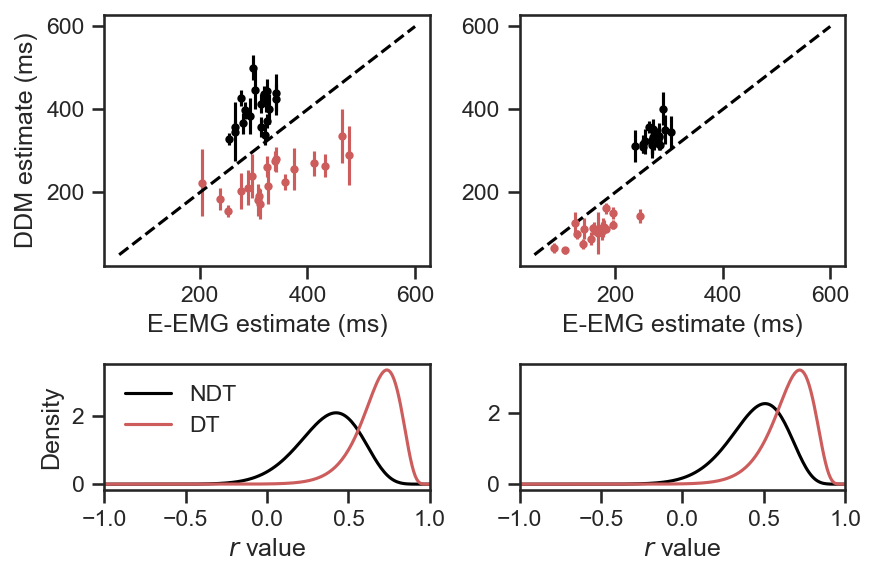

In [61]:
import matplotlib.gridspec as gridspec
plt.figure(dpi=150)
gs = gridspec.GridSpec(2, 2,
                       width_ratios=[2, 2, ],
                       height_ratios=[2, 1])

ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])
ax4 = plt.subplot(gs[3])

plt_dict = {0:ax1, 1:ax2, 2:ax3, 3:ax4}
i = 0
for cell, cell_dat in df.groupby(['SAT']):
    print(cell)
    ax = plt_dict[i]
    ters = cell_dat.groupby('participant').ter.mean()
    dts = cell_dat.groupby('participant').dt.mean()
    DDM_cell = dfDDM[(dfDDM.SAT == cell) ]
    corrs_NDT = [np.corrcoef(x_dat.groupby('participant').t0.mean(), ters)[0,1] for x,x_dat in DDM_cell.groupby('iteration')]
    corrs_DT = [np.corrcoef(x_dat.groupby('participant').MDT.mean(), dts)[0,1] for x,x_dat in DDM_cell.groupby('iteration')]
    ax.errorbar(x=ters, y=DDM_cell.groupby('participant').t0.mean(),yerr=DDM_cell.groupby('participant').t0.std(),fmt='.',color="k")
    ax.errorbar(x=dts, y=DDM_cell.groupby('participant').MDT.mean(),yerr=DDM_cell.groupby('participant').MDT.std(),fmt='.',color="indianred")
    ax.plot([50,600],[50,600],'k',ls='--')
    #plt.hist(corrs_NDT)
    %R -i corrs_NDT
    %R rhohat = postRav(corrs_NDT, 19)
    %R print(postRav.mean(rhohat))
    %R print(postRav.ci(rhohat))
    %R d = postRav.Density(rhohat)
    %R x1_1 = d$x
    %R y1_1 = d$y
    %R -o x1_1,y1_1
    ax = plt_dict[i+2]
    ax.plot(x1_1,y1_1, color="k", label="NDT")
    #plt.hist(corrs_DT)
    %R -i corrs_DT
    %R rhohat = postRav(corrs_DT, 19)
    %R print(postRav.mean(rhohat))
    %R print(postRav.ci(rhohat))
    %R d = postRav.Density(rhohat)
    %R x1_1 = d$x
    %R y1_1 = d$y
    %R -o x1_1,y1_1
    ax.plot(x1_1,y1_1, color="indianred", label="DT")
    ax.set_xlim(-1,1)
    if i == 0:
        ax.legend()
    i+= 1
ax1.set_ylabel(r"DDM estimate (ms)")
ax1.set_xlabel(r"E-EMG estimate (ms)")
ax2.set_xlabel(r"E-EMG estimate (ms)")
ax3.set_ylabel("Density")
ax3.set_xlabel(r"$r$ value")
ax4.set_xlabel(r"$r$ value")
plt.tight_layout()
plt.show()


Note : same pattern when separating high vs low force

## Estimated Effect value correlations

### Effect of force

accuracy
[1] 0.2845102
     0.025      0.975 
-0.1615006  0.6437440 
[1] 0.6646015
    0.025     0.975 
0.3159303 0.8703099 
speed
[1] 0.5764145
    0.025     0.975 
0.1924475 0.8234229 
[1] 0.7537031
    0.025     0.975 
0.4606621 0.9110691 


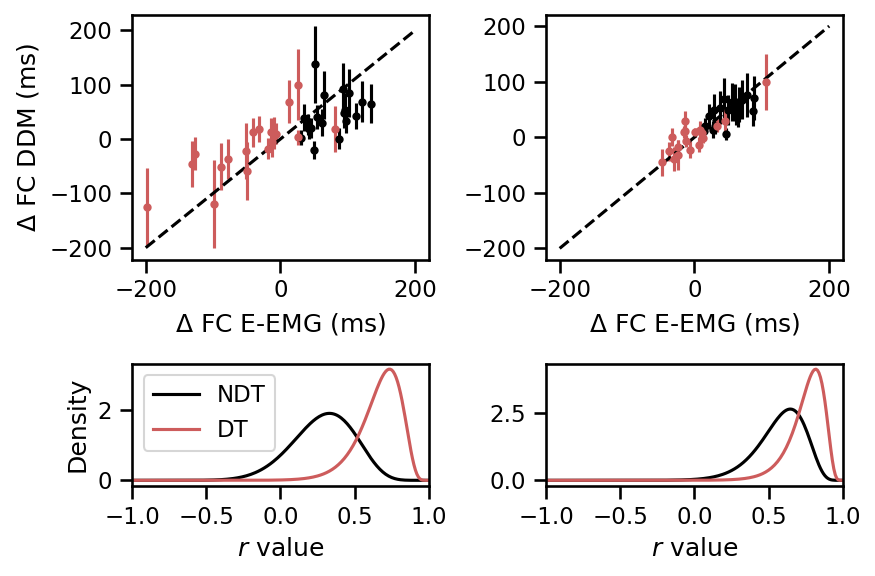

In [6]:
plt.figure(dpi=150)
gs = gridspec.GridSpec(2, 2,
                       width_ratios=[2, 2, ],
                       height_ratios=[2, 1])

ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])
ax4 = plt.subplot(gs[3])

plt_dict = {0:ax1, 1:ax2, 2:ax3, 3:ax4}
i = 0
misfit_FC = []
for cell, cell_dat in df.groupby(['SAT']):
    print(cell)
    ax = plt_dict[i]
    ters = cell_dat[cell_dat.FC == 2].groupby('participant').ter.mean() - cell_dat[cell_dat.FC == 1].groupby('participant').ter.mean()
    dts =  cell_dat[cell_dat.FC == 2].groupby('participant').dt.mean() - cell_dat[cell_dat.FC == 1].groupby('participant').dt.mean()
    DDM_cell = dfDDM[(dfDDM.SAT == cell)]
    corrs_NDT = [np.corrcoef(x_dat[x_dat.FC == 2].groupby('participant').t0.mean().values - x_dat[x_dat.FC == 1].groupby('participant').t0.mean().values, ters.values)[0,1] for x,x_dat in DDM_cell.groupby('iteration')]
    corrs_DT = [np.corrcoef(x_dat[x_dat.FC == 2].groupby('participant').MDT.mean().values - x_dat[x_dat.FC == 1].groupby('participant').MDT.mean().values, dts.values)[0,1] for x,x_dat in DDM_cell.groupby('iteration')]
    ax.errorbar(x=ters, y=DDM_cell[DDM_cell.FC == 2].groupby('participant').t0.mean().values - DDM_cell[DDM_cell.FC == 1].groupby('participant').t0.mean().values,yerr=DDM_cell.groupby('participant').t0.std().values,fmt='.',color="k")
    ax.errorbar(x=dts, y=DDM_cell[DDM_cell.FC == 2].groupby('participant').MDT.mean().values - DDM_cell[DDM_cell.FC == 1].groupby('participant').MDT.mean().values,yerr=DDM_cell.groupby('participant').MDT.std().values,fmt='.',color="indianred")
    ax.plot([-200,200],[-200,200],'k',ls='--')
    #plt.hist(corrs_NDT)
    %R -i corrs_NDT
    %R rhohat = postRav(corrs_NDT, 19)
    %R print(postRav.mean(rhohat))
    %R print(postRav.ci(rhohat))
    %R d = postRav.Density(rhohat)
    %R x1_1 = d$x
    %R y1_1 = d$y
    %R -o x1_1,y1_1
    ax = plt_dict[i+2]
    ax.plot(x1_1,y1_1, color="k", label="NDT")
    #plt.hist(corrs_DT)
    %R -i corrs_DT
    %R rhohat = postRav(corrs_DT, 19)
    %R print(postRav.mean(rhohat))
    %R print(postRav.ci(rhohat))
    %R d = postRav.Density(rhohat)
    %R x1_1 = d$x
    %R y1_1 = d$y
    %R -o x1_1,y1_1
    ax.plot(x1_1,y1_1, color="indianred", label="DT")
    ax.set_xlim(-1,1)
    if i == 0:
        ax.legend()
    i += 1
    misfit_FC.append([(x_dat[x_dat.FC == 2].groupby('participant').t0.mean().values - x_dat[x_dat.FC == 1].groupby('participant').t0.mean().values) - ters.values for x,x_dat in DDM_cell.groupby('iteration')])
ax1.set_ylabel(r"$\Delta$ FC DDM (ms)")
ax1.set_xlabel(r"$\Delta$ FC E-EMG (ms)")
ax2.set_xlabel(r"$\Delta$ FC E-EMG (ms)")
ax3.set_ylabel("Density")
ax3.set_xlabel(r"$r$ value")
ax4.set_xlabel(r"$r$ value")
plt.tight_layout()
plt.show()

### Effect of contrast

accuracy
[1] -0.2671136
     0.025      0.975 
-0.6778343  0.2165290 
[1] 0.5822961
    0.025     0.975 
0.1895142 0.8322704 
speed
[1] -0.1189123
     0.025      0.975 
-0.5624819  0.3511676 
[1] 0.3492476
     0.025      0.975 
-0.1040839  0.6961933 


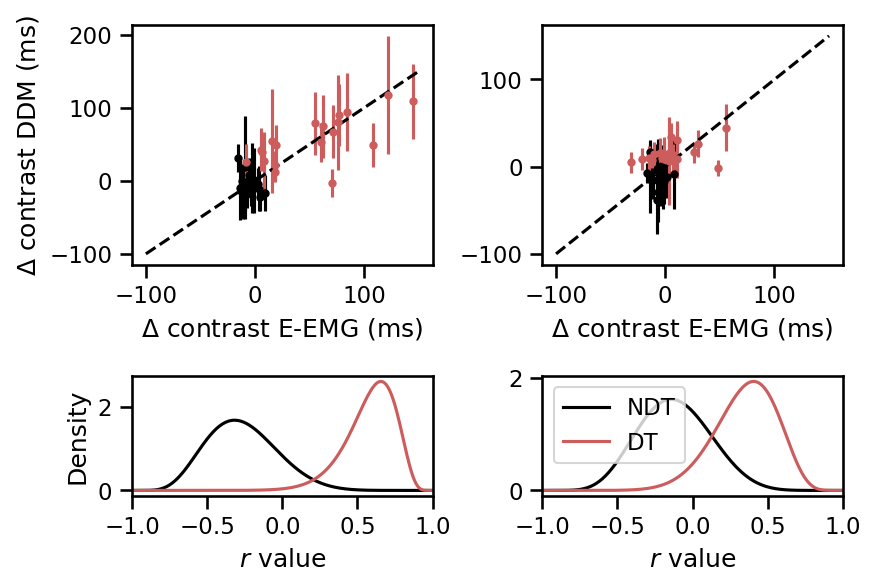

In [9]:
plt.figure(dpi=150)
gs = gridspec.GridSpec(2, 2,
                       width_ratios=[2, 2, ],
                       height_ratios=[2, 1])

ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])
ax3 = plt.subplot(gs[2])
ax4 = plt.subplot(gs[3])

plt_dict = {0:ax1, 1:ax2, 2:ax3, 3:ax4}
i = 0

for cell, cell_dat in df.groupby(['SAT']):
    print(cell)
    ax = plt_dict[i]
    ters = cell_dat[cell_dat.contrast == 3].groupby('participant').ter.mean() - cell_dat[cell_dat.contrast == 1].groupby('participant').ter.mean()
    dts =  cell_dat[cell_dat.contrast == 3].groupby('participant').dt.mean() - cell_dat[cell_dat.contrast == 1].groupby('participant').dt.mean()
    DDM_cell = dfDDM[(dfDDM.SAT == cell)]
    corrs_NDT = [np.corrcoef(x_dat[x_dat.contrast == 3].groupby('participant').t0.mean() - x_dat[x_dat.contrast == 1].groupby('participant').t0.mean(), ters)[0,1] for x,x_dat in DDM_cell.groupby('iteration')]
    corrs_DT = [np.corrcoef(x_dat[x_dat.contrast == 3].groupby('participant').MDT.mean() - x_dat[x_dat.contrast == 1].groupby('participant').MDT.mean(), dts)[0,1] for x,x_dat in DDM_cell.groupby('iteration')]
    ax.errorbar(x=ters, y=DDM_cell[DDM_cell.contrast == 3].groupby('participant').t0.mean() - DDM_cell[DDM_cell.contrast == 1].groupby('participant').t0.mean(),yerr=DDM_cell.groupby('participant').t0.std(),fmt='.',color="k")
    ax.errorbar(x=dts, y=DDM_cell[DDM_cell.contrast == 3].groupby('participant').MDT.mean() - DDM_cell[DDM_cell.contrast == 1].groupby('participant').MDT.mean(),yerr=DDM_cell.groupby('participant').MDT.std(),fmt='.',color="indianred")
    ax.plot([-100,150],[-100,150],'k',ls='--')
    #plt.hist(corrs_NDT)
    %R -i corrs_NDT -o x1_1,y1_1
    %R rhohat = postRav(corrs_NDT, 19)
    %R print(postRav.mean(rhohat))
    %R print(postRav.ci(rhohat))
    %R d = postRav.Density(rhohat)
    %R x1_1 = d$x
    %R y1_1 = d$y
    %R -o x1_1,y1_1
    ax = plt_dict[i+2]
    ax.plot(x1_1,y1_1, color="k", label="NDT")
    #plt.hist(corrs_DT)
    %R -i corrs_DT -o x1_1,y1_1
    %R rhohat = postRav(corrs_DT, 19)
    %R print(postRav.mean(rhohat))
    %R print(postRav.ci(rhohat))
    %R d = postRav.Density(rhohat)
    %R x1_1 = d$x
    %R y1_1 = d$y
    %R -o x1_1,y1_1
    ax.plot(x1_1,y1_1, color="indianred", label="DT")
    ax.set_xlim(-1,1)
    if i == 1:
        ax.legend()
    i += 1
ax1.set_ylabel(r"$\Delta$ contrast DDM (ms)")
ax1.set_xlabel(r"$\Delta$ contrast E-EMG (ms)")
ax2.set_xlabel(r"$\Delta$ contrast E-EMG (ms)")
ax3.set_ylabel("Density")
ax3.set_xlabel(r"$r$ value")
ax4.set_xlabel(r"$r$ value")
plt.tight_layout()
plt.show()

### Effect of SAT

[1] 0.2850337
     0.025      0.975 
-0.1584408  0.6423602 
[1] 0.8347409
    0.025     0.975 
0.6187614 0.9416864 


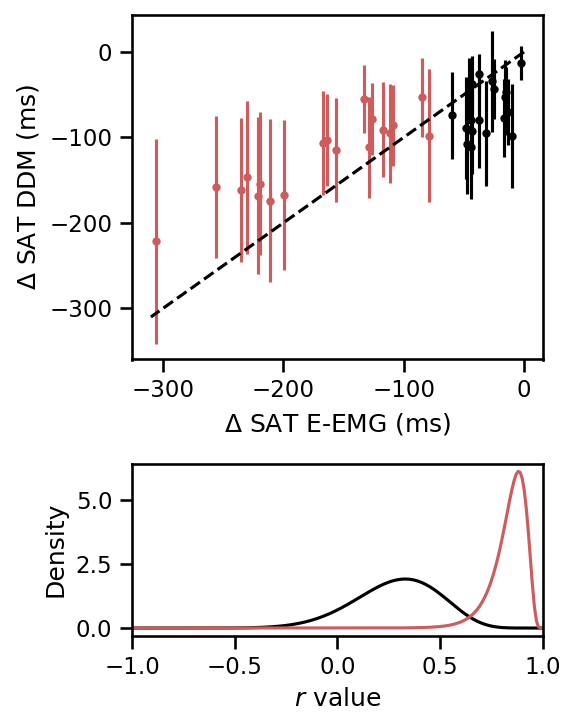

In [8]:
plt.figure(dpi=150, figsize=(4,5))
gs = gridspec.GridSpec(2, 1,
                       height_ratios=[2, 1])

ax1 = plt.subplot(gs[0])

ax3 = plt.subplot(gs[1])

misfit_SAT = []
ax = ax1
ters = df[df.SAT == "speed"].groupby('participant').ter.mean() - df[df.SAT == "accuracy"].groupby('participant').ter.mean()
dts =  df[df.SAT == "speed"].groupby('participant').dt.mean() - df[df.SAT == "accuracy"].groupby('participant').dt.mean()
DDM_cell = dfDDM
corrs_NDT = [np.corrcoef(x_dat[x_dat.SAT == "speed"].groupby('participant').t0.mean() - x_dat[x_dat.SAT == "accuracy"].groupby('participant').t0.mean(), ters)[0,1] for x,x_dat in DDM_cell.groupby('iteration')]
corrs_DT = [np.corrcoef(x_dat[x_dat.SAT == "speed"].groupby('participant').MDT.mean() - x_dat[x_dat.SAT == "accuracy"].groupby('participant').MDT.mean(), dts)[0,1] for x,x_dat in DDM_cell.groupby('iteration')]
ax.errorbar(x=ters, y=DDM_cell[DDM_cell.SAT == "speed"].groupby('participant').t0.mean() - DDM_cell[DDM_cell.SAT == "accuracy"].groupby('participant').t0.mean(),yerr=DDM_cell.groupby('participant').t0.std(),fmt='.',color="k")
ax.errorbar(x=dts, y=DDM_cell[DDM_cell.SAT == "speed"].groupby('participant').MDT.mean() - DDM_cell[DDM_cell.SAT == "accuracy"].groupby('participant').MDT.mean(),yerr=DDM_cell.groupby('participant').MDT.std(),fmt='.',color="indianred")
ax.plot([0,-310],[0,-310],'k',ls='--')
#plt.hist(corrs_NDT)
%R -i corrs_NDT -o x1_1,y1_1
%R rhohat = postRav(corrs_NDT, 19)
%R print(postRav.mean(rhohat))
%R print(postRav.ci(rhohat))
%R d = postRav.Density(rhohat)
%R x1_1 = d$x
%R y1_1 = d$y
%R -o x1_1,y1_1
ax = ax3
ax.plot(x1_1,y1_1, color="k", label="NDT")
#plt.hist(corrs_DT)
%R -i corrs_DT -o x1_1,y1_1
%R rhohat = postRav(corrs_DT, 19)
%R print(postRav.mean(rhohat))
%R print(postRav.ci(rhohat))
%R d = postRav.Density(rhohat)
%R x1_1 = d$x
%R y1_1 = d$y
%R -o x1_1,y1_1
ax.plot(x1_1,y1_1, color="indianred", label="DT")
ax.set_xlim(-1,1)
if i == 1:
    ax.legend()
i += 1

misfit_SAT.append([(x_dat[x_dat.SAT == "accuracy"].groupby('participant').t0.mean().values - x_dat[x_dat.SAT == "speed"].groupby('participant').t0.mean().values) - ters.values for x,x_dat in DDM_cell.groupby('iteration')])


ax1.set_ylabel(r"$\Delta$ SAT DDM (ms)")
ax1.set_xlabel(r"$\Delta$ SAT E-EMG (ms)")
ax3.set_ylabel("Density")
ax3.set_xlabel(r"$r$ value")
plt.tight_layout()
plt.show()

# Appendix

## contribution to MRT

(1.0, 'Accuracy')
0.303
0.564
0.132
N200    185.681741
dt      355.575654
mt       80.739341
rt      621.996735
dtype: float64
(1.0, 'Speed')
0.451
0.391
0.158
N200    183.988661
dt      162.743861
mt       64.638910
rt      411.371432
dtype: float64
(2.0, 'Accuracy')
0.288
0.473
0.238
N200    185.178123
dt      312.923558
mt      155.554102
rt      653.655783
dtype: float64
(2.0, 'Speed')
0.4
0.346
0.254
N200    181.746990
dt      160.857102
mt      116.836024
rt      459.440117
dtype: float64


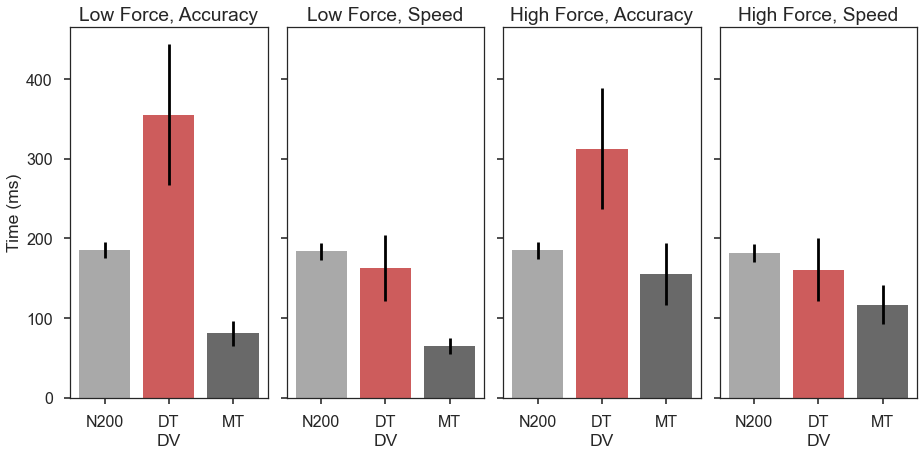

In [11]:
plt.style.use('seaborn-poster')

f, axs = plt.subplots(1,4, figsize=(13, 6.5),sharey=True, sharex=True)
forcedict = {1:'Low',2.:'High'}
j=0

df_SAT = df.copy()
df_SAT.SAT = df_SAT.SAT.replace(['accuracy','speed'], ['Accuracy','Speed'])

for cell, cell_dat in df_SAT.groupby(['FC','SAT']):
    decomposition = cell_dat.groupby('participant').mean()[['N200', 'dt','mt', 'rt']].copy()
    contribution_DT, contribution_MT, contribution_N200 = [],[],[]
    for i in np.arange(len(decomposition)):
        contribution_DT.append(1-(decomposition.rt[i] - decomposition.dt[i])/decomposition.rt[i])
        contribution_MT.append(1-(decomposition.rt[i] - decomposition.mt[i])/decomposition.rt[i])
        contribution_N200.append(1-(decomposition.rt[i] - decomposition.N200[i])/decomposition.rt[i])
    print(cell)
    print(np.round(np.mean(contribution_N200),3))
    print(np.round(np.mean(contribution_DT),3))
    print(np.round(np.mean(contribution_MT),3))
    del decomposition['rt']
    decomposition.columns = ['N200', 'DT','MT']
    ave = decomposition.mean().copy()
    sd = decomposition.std().copy()
    decomposition.loc['']  = [0,0,0]
    decomposition.loc['Average']  = ave
    decomposition.loc['sd']  = sd
    #decomposition.loc['Average'].plot(kind='bar', stacked=True, ax=axs[j], color=colors_wrt[1:])
    axs[j].bar(x=[0,1,2], height=decomposition.loc['Average'], color=colors_wrt[1:], yerr=decomposition.loc['sd'])
    print(np.mean(cell_dat.groupby('participant').mean()[['N200', 'dt','mt', 'rt']]))

    if j == 0:
        axs[j].set(ylabel="Time (ms)", xticklabels=('','N200','DT','MT'),
           xlabel='DV',title='%s Force, %s'%(forcedict[cell[0]],cell[1]))
    else:
        axs[j].set(xlabel='DV',title='%s Force, %s'%(forcedict[cell[0]],cell[1]))
    #sns.despine(left=True, bottom=True)
    #if j < 3:
    #    axs[j].legend_.remove()
    j += 1
    
plt.tight_layout()

#sns.despine(left=True, bottom=True)
#plt.savefig('/home/gweindel/satmotor/manuscript/plots/Exp2/SATdecomposition.eps', format='eps')
plt.show()


Effet moyen conditions (avec ou sans contraste), autre plot avec a l'interieur d'une cellule la variabilité inter-indiv. Ou plutôt les écarts-types ? 

## Variability within a participant : example for S1

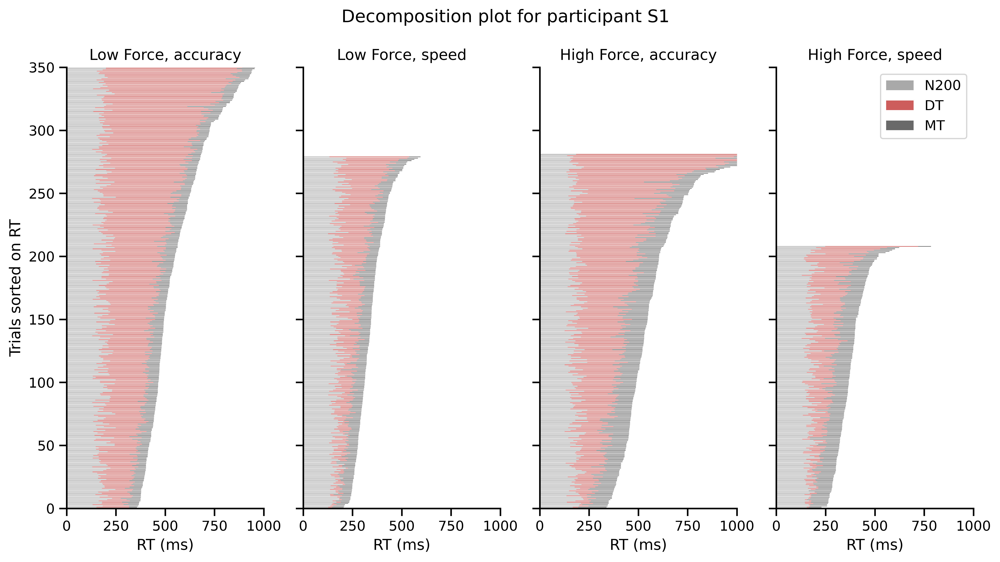

In [39]:
f, axs = plt.subplots(1,4, figsize=(13, 6.5),sharey=True, sharex=True,dpi=600)
forcedict = {1.:'Low',2.:'High'}
j=0
for cell, cell_dat in df.groupby(['FC','SAT']):
    decomposition = cell_dat[cell_dat.participant == "S1"][['N200','dt','mt','rt']]
    decomposition = decomposition.sort_values('rt')
    del decomposition['rt']
    decomposition.columns = ['N200', 'DT','MT']
    decomposition = decomposition.reset_index(drop=True)
    decomposition.plot(kind='barh', stacked=True, ax=axs[j], color=colors_wrt[1:])
    #axs[j].set_yticklabels([t if not i%50 else "" for i,t in enumerate(axs[j].get_yticklabels())])
    axs[j].set(ylabel="Trials sorted on RT", yticks=[0,50,100,150,200,250,300,350],ylim=(0,350),
           xlabel='RT (ms)', title='%s Force, %s'%(forcedict[cell[0]],cell[1]),
            yticklabels=[0,50,100,150,200,250,300,350],xlim=(0,1000))
    sns.despine(left=False, bottom=False)
    if j < 3:
        axs[j].legend_.remove()
    j += 1

#plt.tight_layout()
f.suptitle("Decomposition plot for participant S1", fontsize=14)
#sns.despine(left=True, bottom=True)

plt.savefig('../S1decomp.png', dpi=600, bbox_inches='tight')
plt.show()


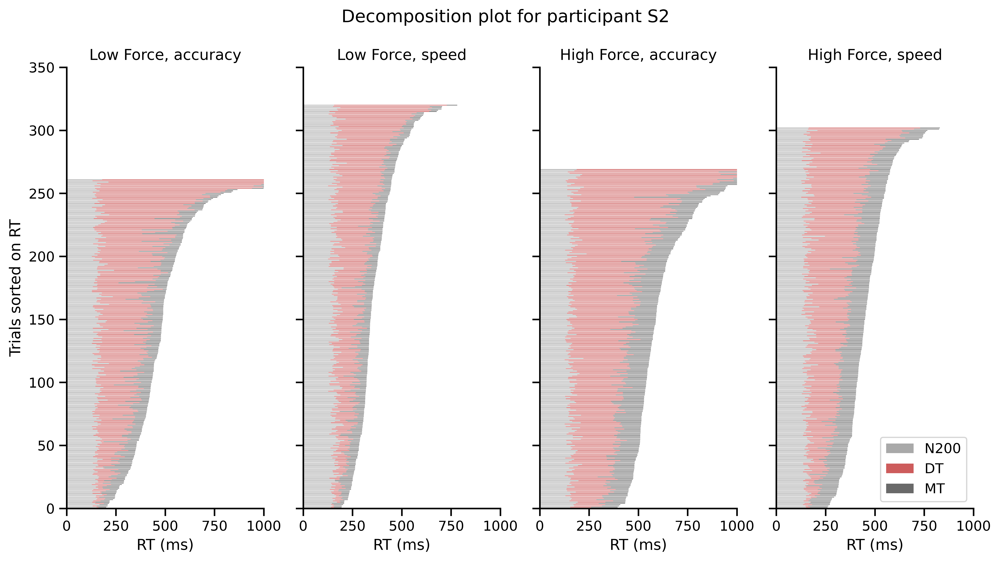

In [11]:
f, axs = plt.subplots(1,4, figsize=(13, 6.5),sharey=True, sharex=True,dpi=600)
forcedict = {1.:'Low',2.:'High'}
j=0
for cell, cell_dat in df.groupby(['FC','SAT']):
    decomposition = cell_dat[cell_dat.participant == "S2"][['N200','dt','mt','rt']]
    decomposition = decomposition.sort_values('rt')
    del decomposition['rt']
    decomposition.columns = ['N200', 'DT','MT']
    decomposition = decomposition.reset_index(drop=True)
    decomposition.plot(kind='barh', stacked=True, ax=axs[j], color=colors_wrt[1:])
    #axs[j].set_yticklabels([t if not i%50 else "" for i,t in enumerate(axs[j].get_yticklabels())])
    axs[j].set(ylabel="Trials sorted on RT", yticks=[0,50,100,150,200,250,300,350],ylim=(0,350),
           xlabel='RT (ms)', title='%s Force, %s'%(forcedict[cell[0]],cell[1]),
            yticklabels=[0,50,100,150,200,250,300,350],xlim=(0,1000))
    sns.despine(left=False, bottom=False)
    if j < 3:
        axs[j].legend_.remove()
    j += 1

#plt.tight_layout()
f.suptitle("Decomposition plot for participant S2", fontsize=14)
#sns.despine(left=True, bottom=True)

plt.savefig('../S2decomp.png', dpi=600, bbox_inches='tight')
plt.show()


# Distributions

## Plotting distributions : CDF vincentisized latencies

In [40]:
def quantile_cut(dataf, units, split, chron, y, n=5):
    '''
    dataf = dataframe
    units = participants, must be list
    split = factors to spli along (e.g SAT,...), must be list
    chron = chronometric variaqble to make quantiles of
    y = other variable that we want to compute the value at given quantile
    '''
    value, condition, quantile,names, part = [],[],[],[],[]
    tmp = dataf.copy()
    for cell, cell_dat in tmp.groupby(units + split):
        cell_dat = cell_dat.copy()
        cell_dat["quant"] = pd.qcut(cell_dat[chron], n)
        name_quanti = [str(a) for a in cell_dat.groupby("quant")[chron].mean().index]
        mean_chron = cell_dat.groupby("quant")[chron].mean().values
        cell_dat["quant"] = [str(a) for a in cell_dat["quant"]]
        cell_dat["quant"] = cell_dat["quant"].replace(name_quanti, mean_chron)
        cell_dat["names"] = pd.qcut(cell_dat[chron], n, labels=False)
        for quant, quant_dat in cell_dat.groupby('quant'):
            value.append(quant_dat[y].mean())
            condition.append(cell[1:])
            part.append(cell[0])
            quantile.append(quant)
            names.append(quant_dat.names.unique()[0])
    dfout = pd.concat([pd.Series(value), pd.Series(condition),pd.Series(part),pd.Series(quantile),pd.Series(names)], axis=1)
    dfout.columns = ['y','condition','units','quant','names']
    return dfout


Text(0.5, 8.500000000000075, 'MT (ms)')

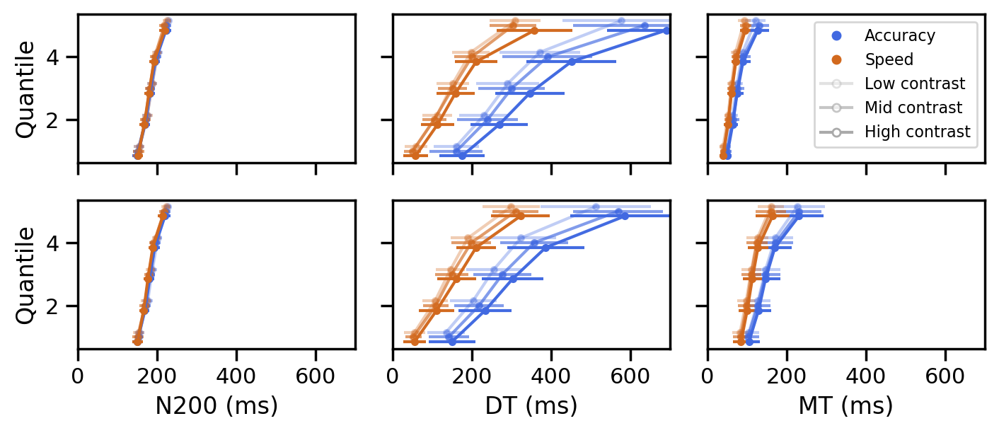

In [43]:
from matplotlib.lines import Line2D
from matplotlib.patches import Polygon

fig,ax = plt.subplots(2,3,figsize=(7,3), dpi=200,sharex=True, sharey=True)

legend_elements = [Line2D([], [], marker="o", markersize=4, linewidth=0, color="royalblue", label="Accuracy"),
                   Line2D([], [], marker="o", markersize=4, linewidth=0, color="chocolate", label="Speed"),
                   Line2D([0], [0], marker='o', color='darkgray', alpha=.33, label='Low contrast',
                          markerfacecolor='w', markersize=4),
                   Line2D([0], [0], marker='o', color='darkgray', alpha=.66, label='Mid contrast',
                          markerfacecolor='w', markersize=4),
                  Line2D([0], [0], marker='o', color='darkgray', alpha=.99, label='High contrast',
                          markerfacecolor='w', markersize=4),]

chrons=['dt','mt','N200']
#colors={'rt':'purple','dt':'indianred','mt':'royalblue','N200':'k'}
order={'rt':0,'dt':1,'mt':2,'N200':0}
alphas = {1:0.33, 2:0.66, 3:0.99}
i=0.15
for contrast in [1,2,3]:
    for chron in chrons:
        j = order[chron]
        ax[0,j].errorbar(x=quantile_cut(df[(df.response == 1) & (df.SAT == "accuracy") & (df.FC == 1) & (df.contrast == contrast)], ['participant'],['SAT'],chron, chron).groupby('names').mean().y.values,y=np.linspace(1,5,5)+i,fmt='o-',xerr=quantile_cut(df[(df.response == 1) & (df.SAT == "accuracy") & (df.FC == 1) & (df.contrast == contrast)], ['participant'],['SAT'],chron, chron).groupby('names').std().y.values*1,ms=3, alpha=alphas[contrast],color='royalblue', label="Accuracy")
        ax[0,j].errorbar(x=quantile_cut(df[(df.response == 1) & (df.SAT == "speed") & (df.FC == 1) & (df.contrast == contrast)], ['participant'],['SAT'],chron, chron).groupby('names').mean().y.values,y=np.linspace(1,5,5)+i,fmt='o-',xerr=quantile_cut(df[(df.response == 1) & (df.SAT == "speed") & (df.FC == 1) & (df.contrast == contrast)], ['participant'],['SAT'],chron, chron).groupby('names').std().y.values*1,ms=3, alpha=alphas[contrast],color='chocolate', label="Speed")
        ax[1,j].errorbar(x=quantile_cut(df[(df.response == 1) & (df.SAT == "accuracy") & (df.FC == 2) & (df.contrast == contrast)], ['participant'],['SAT'],chron, chron).groupby('names').mean().y.values,y=np.linspace(1,5,5)+i,fmt='o-',xerr=quantile_cut(df[(df.response == 1) & (df.SAT == "accuracy") & (df.FC == 2) & (df.contrast == contrast)], ['participant'],['SAT'],chron, chron).groupby('names').std().y.values*1,ms=3, alpha=alphas[contrast],color='royalblue')
        ax[1,j].errorbar(x=quantile_cut(df[(df.response == 1) & (df.SAT == "speed") & (df.FC == 2) & (df.contrast == contrast)], ['participant'],['SAT'],chron, chron).groupby('names').mean().y.values,y=np.linspace(1,5,5)+i,fmt='o-',xerr=quantile_cut(df[(df.response == 1) & (df.SAT == "speed") & (df.FC == 2) & (df.contrast == contrast)], ['participant'],['SAT'],chron, chron).groupby('names').std().y.values*1,ms=3, alpha=alphas[contrast],color='chocolate')
    i -= .15
plt.xlim(0,700)
ax[0,2].legend(handles=legend_elements, loc=1, prop={'size': 8})
plt.tight_layout()
ax[0,0].set_ylabel('Quantile')
ax[1,0].set_ylabel('Quantile')
ax[1,0].set_xlabel('N200 (ms)')
ax[1,1].set_xlabel('DT (ms)')
ax[1,2].set_xlabel('MT (ms)')

## Replication of LMMs on precision and RT on the full data frame


In [2]:
Precision_fit = az.from_netcdf('MixedModels/FittedModels/Precision_fit.nc')
Precision_fit_df_full = az.from_netcdf('MixedModels/FittedModels/Precision_fit_df_full.nc')
RT_fit = az.from_netcdf('MixedModels/FittedModels/RT_fit.nc')
RT_fit_df_full = az.from_netcdf('MixedModels/FittedModels/RT_fit_df_full.nc')

__index X Factor mapping :__
- beta[0] = SAT
- beta[1] = FC
- beta[2] = contrast
- beta[3] = SATxFC
- beta[4] = SATxcontrast
- beta[5] = FCxcontrast
- beta[6] = SATxFCxcontrast

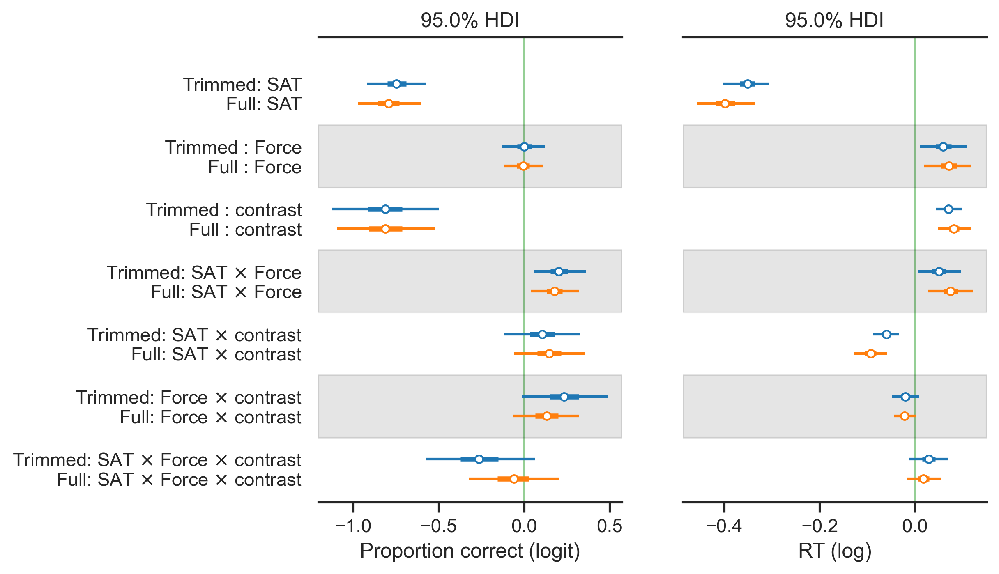

In [6]:
fig, (ax0,ax1) = plt.subplots(1,2,sharey=False, sharex=False, figsize=(7,5), dpi=300)
g = az.plot_forest([Precision_fit, Precision_fit_df_full], var_names=["beta"], hdi_prob=0.95,  model_names=['Trimmed','Full'],
                   combined=True, rope=[-0,0], ax=ax0)

g = az.plot_forest([RT_fit, RT_fit_df_full], var_names=["beta"], hdi_prob=0.95, model_names=['Trimmed','Full'],
                   combined=True, rope=[-0,0], ax=ax1)
ax0.set(yticklabels=reversed(['Trimmed: SAT','Full: SAT','Trimmed : Force','Full : Force','Trimmed : contrast','Full : contrast',r'Trimmed: SAT $\times$ Force',r'Full: SAT $\times$ Force',r'Trimmed: SAT $\times$ contrast',r'Full: SAT $\times$ contrast',r'Trimmed: Force $\times$ contrast',r'Full: Force $\times$ contrast',r"Trimmed: SAT $\times$ Force $\times$ contrast",r"Full: SAT $\times$ Force $\times$ contrast"]),xlabel="Proportion correct (logit)")
ax1.set(yticklabels="",xlabel="RT (log)")
plt.show()

